In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.neighbors import NearestNeighbors
from itertools import product
import plotly.express as px

# EDA

Attributes

- People

  - ID: Customer's unique identifier
  - Year_Birth: Customer's birth year
  - Education: Customer's education level
  - Marital_Status: Customer's marital status
  - Income: Customer's yearly household income
  - Kidhome: Number of children in customer's household
  - Teenhome: Number of teenagers in customer's household
  - Dt_Customer: Date of customer's enrollment with the company
  - Recency: Number of days since customer's last purchase
  - Complain: 1 if the customer complained in the last 2 years, 0 otherwise

- Products

  - MntWines: Amount spent on wine in last 2 years
  - MntFruits: Amount spent on fruits in last 2 years
  - MntMeatProducts: Amount spent on meat in last 2 years
  - MntFishProducts: Amount spent on fish in last 2 years
  - MntSweetProducts: Amount spent on sweets in last 2 years
  - MntGoldProds: Amount spent on gold in last 2 years

- Promotion

  - NumDealsPurchases: Number of purchases made with a discount
  - AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
  - AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
  - AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
  - AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
  - AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
  - Response: 1 if customer accepted the offer in the last campaign, 0 otherwise

- Place

  - NumWebPurchases: Number of purchases made through the company’s website
  - NumCatalogPurchases: Number of purchases made using a catalogue
  - NumStorePurchases: Number of purchases made directly in stores
  - NumWebVisitsMonth: Number of visits to company’s website in the last month

In [2]:
df_marketing_campaign = pd.read_csv('datasets/marketing_campaign.csv', sep='\t')

In [3]:
if(pd.options.display.max_columns < df_marketing_campaign.shape[1]):
  pd.options.display.max_columns = df_marketing_campaign.shape[1]

In [4]:
df_marketing_campaign.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [5]:
df_marketing_campaign.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [6]:
df_marketing_campaign.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

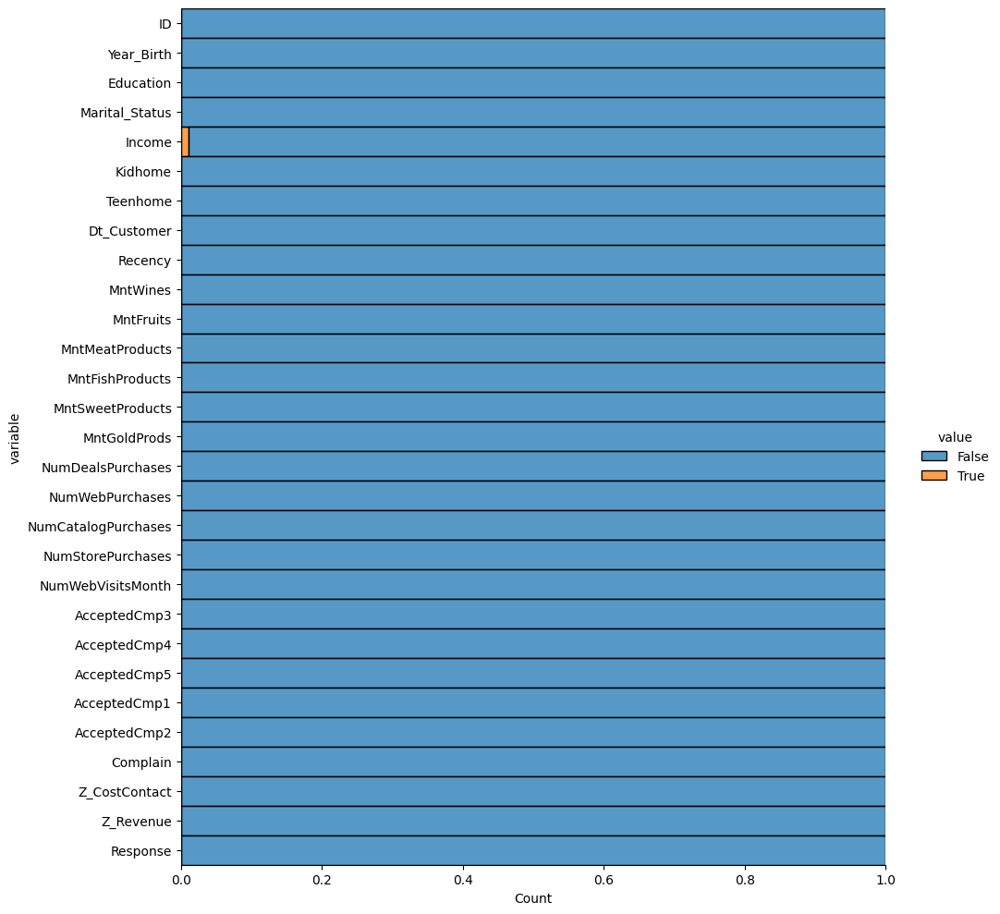

In [7]:
df_marketing_campaign.isna().melt().pipe(
    lambda df:(
        sns.displot(
            data=df,
            y='variable',
            hue='value',
            multiple='fill',
            height=10
        )
    )
)
plt.show()

In [8]:
pd.options.display.max_columns = df_marketing_campaign.shape[1]
df_marketing_campaign.describe().T


,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.251354,25173.076661,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0


## Numeric columns

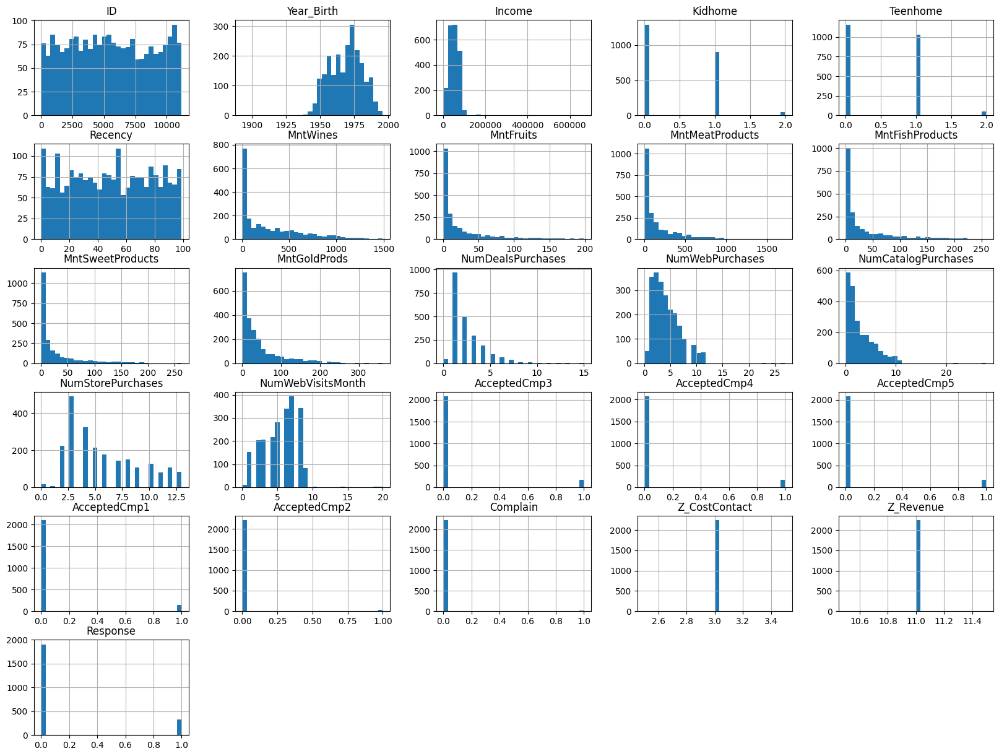

In [9]:
df_marketing_campaign.hist(bins=30, figsize=(20, 15))
plt.show()

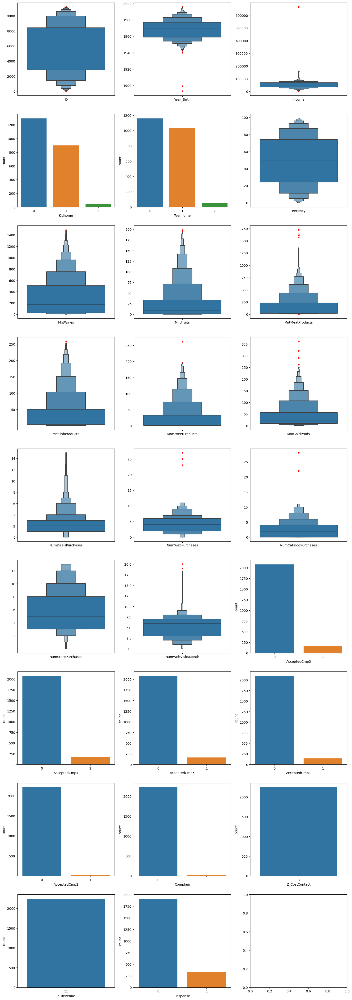

In [10]:
df_marketing_campaign_num = df_marketing_campaign.select_dtypes(include='number')
n_cols =  3
red_circle_boxen = dict(color='red', marker='o', edgecolors='white')
n_rows = int(np.ceil(((df_marketing_campaign_num.shape[1]-1) / n_cols)))
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(18, (n_rows*6)))

for i, column in enumerate(df_marketing_campaign_num.columns):
       if(len(df_marketing_campaign_num[column].unique()) <= 10):
              sns.countplot(
                     df_marketing_campaign_num[[column]], 
                     x = column,
                     ax=axes[i//n_cols,i%n_cols],
              )
       else:
              sns.boxenplot(
                     df_marketing_campaign_num[[column]],
                     ax=axes[i//n_cols,i%n_cols],
                     flier_kws=red_circle_boxen
              )

List of numeric columns to analyze:
1. Year_birth (also we considerate it as Datetime object)
2. Income
4. MntMeatProducts
5. MntSweetProducts
6. NumWebPurchases
7. NumCatalogPurchases
8. NumWebVisitsMonth
9. Z_CostContact
10. Z_Revenue

## Object columns

In [11]:
df_marketing_campaign.describe(include='object')

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,31-08-2012
freq,1127,864,12


Dt_customer is a Datetime object

In [12]:
df_marketing_campaign['Dt_Customer'] = pd.to_datetime(df_marketing_campaign['Dt_Customer'], format='%d-%m-%Y')


Education


Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64


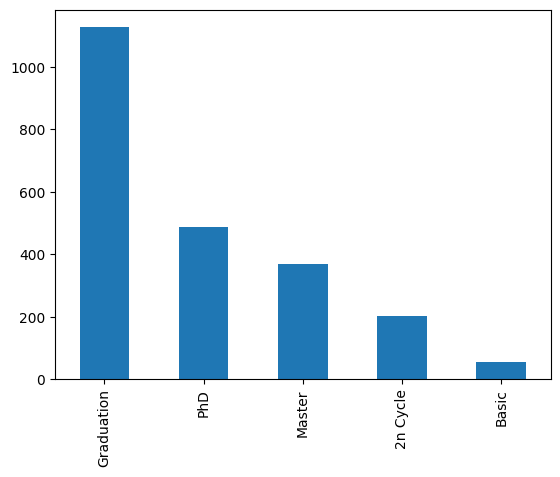



Marital_Status


Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64


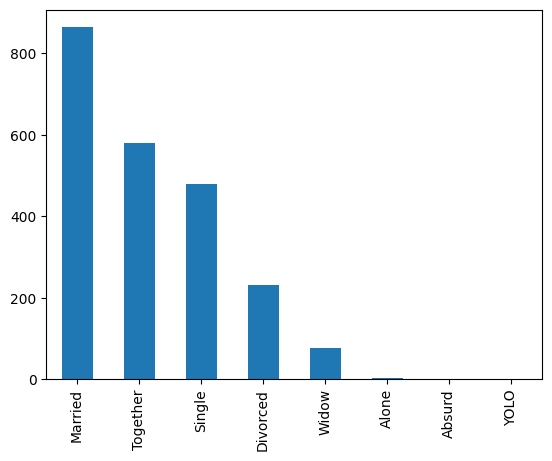

In [13]:
df_marketing_campaign.select_dtypes(include='object').value_counts()

df_marketing_campaign_object = df_marketing_campaign.select_dtypes(include='object')
df_marketing_campaign_object_columns = df_marketing_campaign.select_dtypes(include='object').columns

for col in df_marketing_campaign_object_columns:
  print(col)
  print('\n')
  print(df_marketing_campaign_object[col].value_counts())
  df_marketing_campaign_object[col].value_counts().plot(kind='bar')
  plt.show()
  print('\n')


To do in object columns:
1. Ordinal encoder in Education column.
2. Drop Absurd and YOLO values and group all values in a new column that says if the customer is with a partner or not.

## Datetime column

<AxesSubplot: >

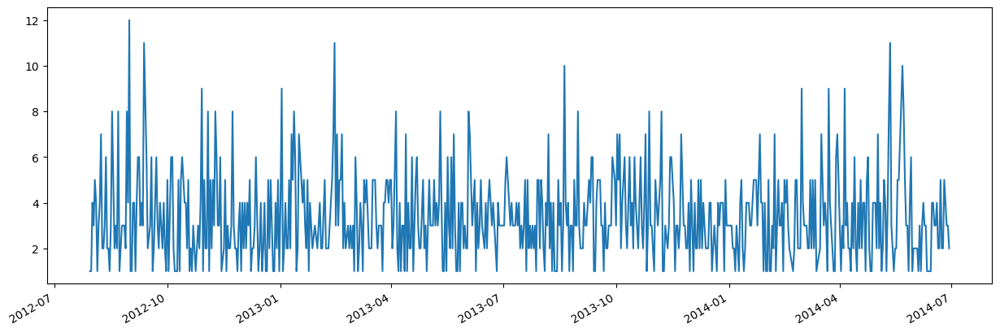

In [14]:
df_marketing_campaign['Dt_Customer'].value_counts().plot(figsize=(15,5))

# Data Cleaning

In [15]:
df_marketing_campaign.describe(include=['object', 'number'])


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2240,2240,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
unique,NaN,NaN,5,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Graduation,Married,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,1127,864,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,5592.159821,1968.805804,NaN,NaN,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,NaN,NaN,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,NaN,NaN,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,NaN,NaN,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,NaN,NaN,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,NaN,NaN,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000


### Year_Birth Column

We create a new column to determine if makes sense the age that people had at the moment of enrollment with the company. If not, we drop those rows.

<AxesSubplot: >

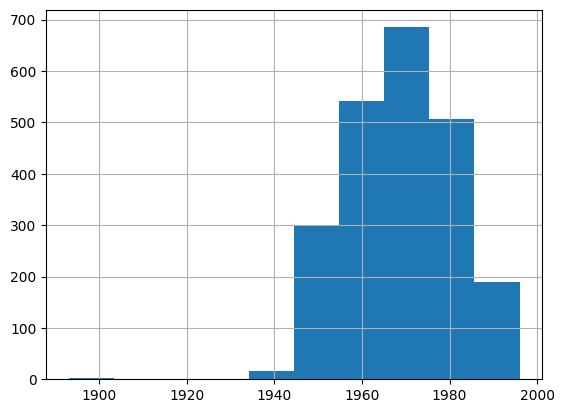

In [16]:
df_marketing_campaign['Year_Birth'].hist()

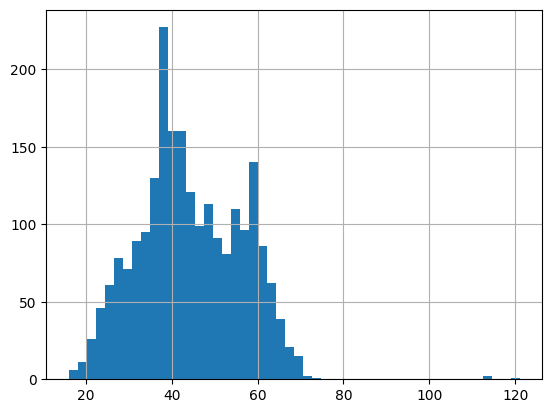

61     36
62     50
63     30
64     32
65     18
66     21
67     12
68      9
69      6
70      9
71      1
72      1
73      1
113     1
114     1
121     1
Name: age_customer_enrollment, dtype: int64


In [17]:
df_marketing_campaign['age_customer_enrollment'] = pd.to_datetime(df_marketing_campaign['Dt_Customer'], format='%d-%m-%Y').dt.year - pd.to_datetime(df_marketing_campaign['Year_Birth'], format='%Y').dt.year

df_marketing_campaign['age_customer_enrollment'].hist(bins=50)
plt.show()
print(df_marketing_campaign[df_marketing_campaign['age_customer_enrollment']> 60]['age_customer_enrollment'].value_counts().sort_index())

Drop rows where the age of the customer is more than 73.

<AxesSubplot: >

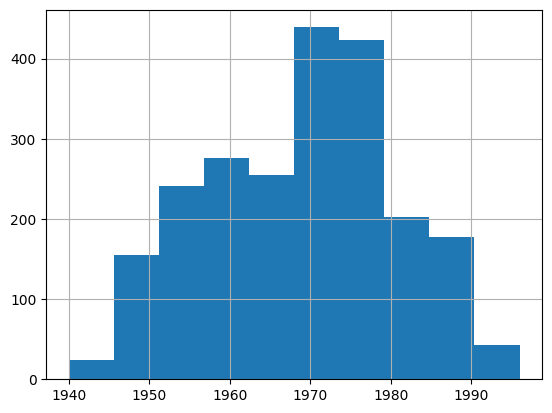

In [18]:
index_to_drop = df_marketing_campaign[df_marketing_campaign['age_customer_enrollment']> 73].index

df_marketing_campaign.drop(index=index_to_drop, axis=0, inplace=True)
df_marketing_campaign['Year_Birth'].hist()

### Income Column

First, we drop the null values that we have only found in the Income column, then we analize for outliers and remove if considered.

In [19]:
df_marketing_campaign.dropna(inplace=True)

In [20]:
df_marketing_campaign['Income'].describe()

count      2213.000000
mean      52236.581563
std       25178.603047
min        1730.000000
25%       35246.000000
50%       51373.000000
75%       68487.000000
max      666666.000000
Name: Income, dtype: float64

In [21]:
df_marketing_campaign['Income'].sort_values(ascending=False).head(15)

2233    666666.0
617     162397.0
687     160803.0
1300    157733.0
164     157243.0
1653    157146.0
2132    156924.0
655     153924.0
1898    113734.0
646     105471.0
252     102692.0
203     102160.0
124     101970.0
650      98777.0
1113     98777.0
Name: Income, dtype: float64

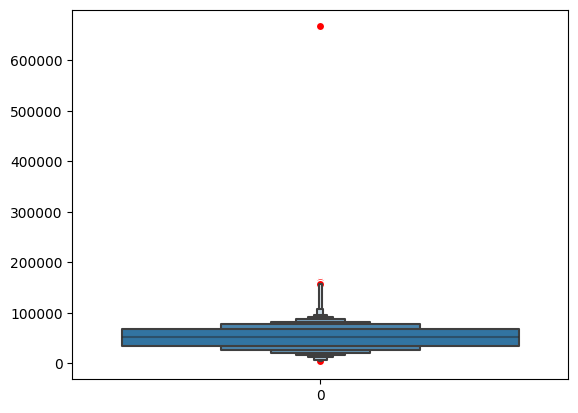

In [22]:
sns.boxenplot(
    df_marketing_campaign['Income'],
    flier_kws=red_circle_boxen
)
plt.show()

In [23]:
index_to_drop = df_marketing_campaign['Income'][df_marketing_campaign['Income'] >= 153000].index
df_marketing_campaign.drop(index=index_to_drop, inplace=True, axis=0)

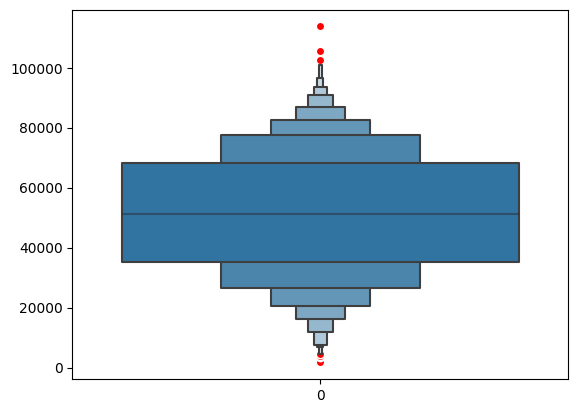

In [24]:
sns.boxenplot(
    df_marketing_campaign['Income'],
    flier_kws=red_circle_boxen
)
plt.show()

### MntMeatProducts Column

In [25]:
df_marketing_campaign['MntMeatProducts'].describe()

count    2205.000000
mean      165.312018
std       217.784507
min         0.000000
25%        16.000000
50%        68.000000
75%       232.000000
max      1725.000000
Name: MntMeatProducts, dtype: float64

In [26]:
df_marketing_campaign['MntMeatProducts'].sort_values(ascending=False).head(15)

21      1725
1358     984
1808     981
456      974
2109     968
1031     961
1958     951
126      951
1259     946
561      940
1713     936
1721     935
2010     932
845      929
76       925
Name: MntMeatProducts, dtype: int64

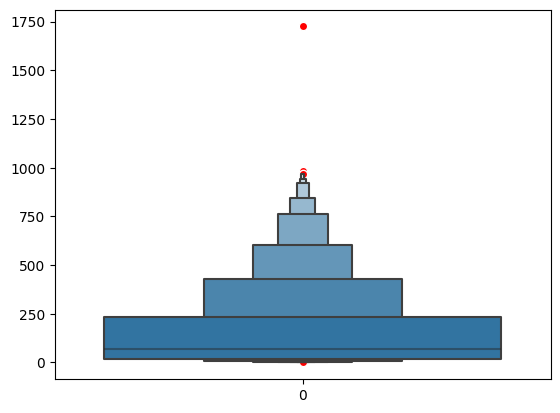

In [27]:
sns.boxenplot(
    df_marketing_campaign['MntMeatProducts'],
    flier_kws=red_circle_boxen
)
plt.show()

In [28]:
index_to_drop = df_marketing_campaign['MntMeatProducts'][df_marketing_campaign['MntMeatProducts'] > 1500].index
df_marketing_campaign.drop(index=index_to_drop, inplace=True, axis=0)

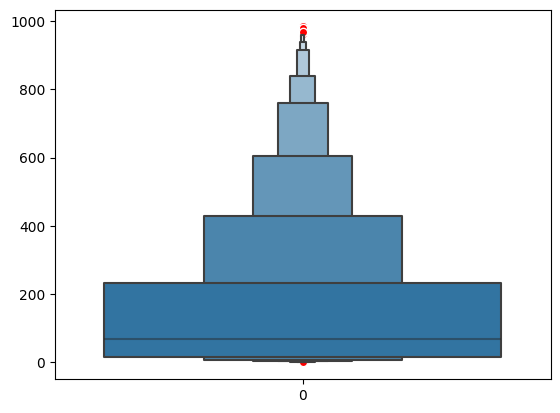

In [29]:
sns.boxenplot(
    df_marketing_campaign['MntMeatProducts'],
    flier_kws=red_circle_boxen
)
plt.show()

Removed outliers.

### MntSweetProducts Column

In [30]:
df_marketing_campaign['MntSweetProducts'].describe()

count    2204.000000
mean       27.140200
std        41.136034
min         0.000000
25%         1.000000
50%         8.000000
75%        34.000000
max       262.000000
Name: MntSweetProducts, dtype: float64

In [31]:
df_marketing_campaign['MntSweetProducts'].sort_values(ascending=False).head(15)

1898    262
634     198
1513    197
1671    196
1253    195
456     194
2012    194
1484    194
470     192
2096    192
2168    192
461     191
347     189
1259    189
1824    188
Name: MntSweetProducts, dtype: int64

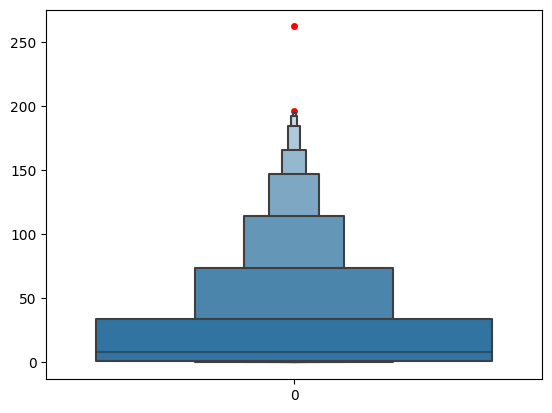

In [32]:
sns.boxenplot(
    df_marketing_campaign['MntSweetProducts'],
    flier_kws=red_circle_boxen
)
plt.show()

In [33]:
index_to_drop = df_marketing_campaign['MntSweetProducts'][df_marketing_campaign['MntSweetProducts'] > 200].index
df_marketing_campaign.drop(index=index_to_drop, inplace=True, axis=0)

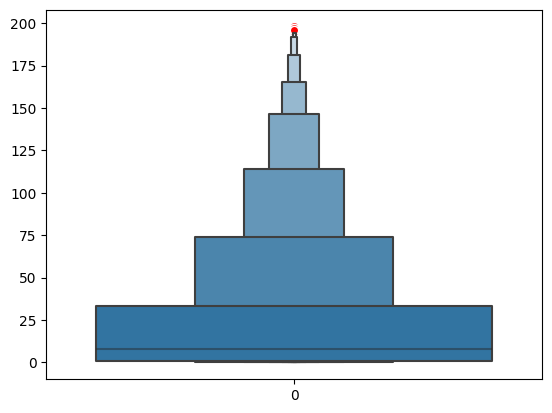

In [34]:
sns.boxenplot(
    df_marketing_campaign['MntSweetProducts'],
    flier_kws=red_circle_boxen
)
plt.show()

Remove outliers.

### NumWebPurchases Column

In [35]:
df_marketing_campaign['NumWebPurchases'].describe()

count    2203.000000
mean        4.092147
std         2.693408
min         0.000000
25%         2.000000
50%         4.000000
75%         6.000000
max        25.000000
Name: NumWebPurchases, dtype: float64

In [36]:
df_marketing_campaign['NumWebPurchases'].sort_values(ascending=False).head(15)

1975    25
1806    23
1022    11
202     11
1309    11
2013    11
797     11
1488    11
67      11
1744    11
1252    11
336     11
2171    11
1226    11
1783    11
Name: NumWebPurchases, dtype: int64

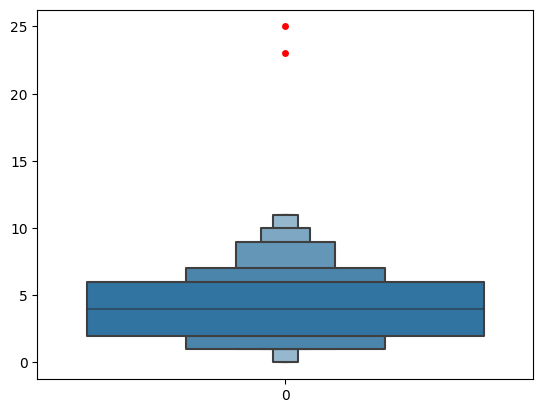

In [37]:
sns.boxenplot(
    df_marketing_campaign['NumWebPurchases'],
    flier_kws=red_circle_boxen
)
plt.show()

In [38]:
index_to_drop = df_marketing_campaign['NumWebPurchases'][df_marketing_campaign['NumWebPurchases'] > 20].index
df_marketing_campaign.drop(index=index_to_drop, inplace=True, axis=0)

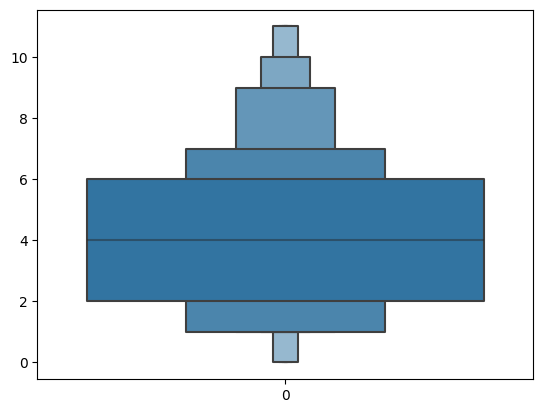

In [39]:
sns.boxenplot(
    df_marketing_campaign['NumWebPurchases'],
    flier_kws=red_circle_boxen
)
plt.show()

Remove outliers.

### NumCatalogPurchases Column

In [40]:
df_marketing_campaign['NumCatalogPurchases'].describe()

count    2201.000000
mean        2.636983
std         2.747143
min         0.000000
25%         0.000000
50%         2.000000
75%         4.000000
max        11.000000
Name: NumCatalogPurchases, dtype: float64

In [41]:
df_marketing_campaign['NumCatalogPurchases'].sort_values(ascending=False).head(15)

764     11
984     11
1828    11
627     11
104     11
636     11
1745    11
1492    11
1465    11
777     11
1452    11
1212    11
591     11
1906    11
934     11
Name: NumCatalogPurchases, dtype: int64

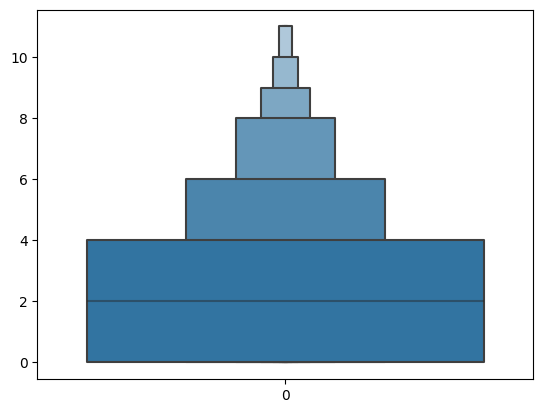

In [42]:
sns.boxenplot(
    df_marketing_campaign['NumCatalogPurchases'],
    flier_kws=red_circle_boxen
)
plt.show()

In [43]:
df_marketing_campaign['NumCatalogPurchases'].value_counts()

0     569
1     489
2     274
3     182
4     181
5     137
6     127
7      79
8      55
10     47
9      42
11     19
Name: NumCatalogPurchases, dtype: int64

We are not going to drop anything here in the NumCatalogPurchases Column.

### NumWebVisitsMonth Column

In [44]:
df_marketing_campaign['NumWebVisitsMonth'].describe()

count    2201.000000
mean        5.345298
std         2.407712
min         0.000000
25%         3.000000
50%         6.000000
75%         7.000000
max        20.000000
Name: NumWebVisitsMonth, dtype: float64

In [45]:
df_marketing_campaign['NumWebVisitsMonth'].sort_values(ascending=False).head(15)

774     20
9       20
1245    20
1042    19
1846    19
1328    17
1524    14
981     14
2214    13
1868    10
605     10
47      10
1334     9
1442     9
651      9
Name: NumWebVisitsMonth, dtype: int64

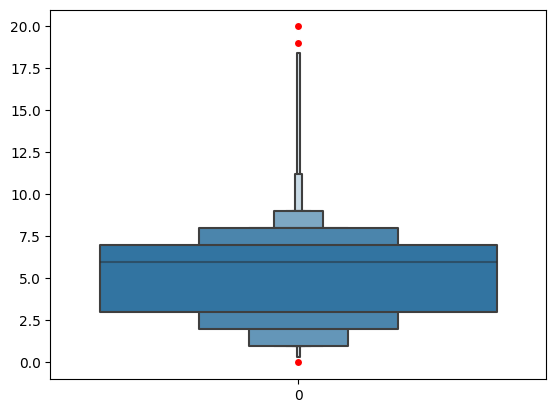

In [46]:
sns.boxenplot(
    df_marketing_campaign['NumWebVisitsMonth'],
    flier_kws=red_circle_boxen
)
plt.show()

We are not going to drop anything here in the NumWebVisitsMonth Column

### Z_CostContact and Z_Revenue Columns

These columns have constant values and do not add anything valuable. We drop them

In [47]:
df_marketing_campaign.drop(columns=['Z_CostContact', 'Z_Revenue'], inplace=True)

### Education Column

We are going to group 2n Cycle with Master and then use Ordinal Encoder to assign each category to a different integer. The order will be:

0. Basic
1. Graduation
2. Master
3. PhD

In [48]:
df_marketing_campaign['Education'].value_counts()

Graduation    1111
PhD            474
Master         364
2n Cycle       198
Basic           54
Name: Education, dtype: int64

In [49]:
df_marketing_campaign['Education'].replace(['2n Cycle'], ['Master'], inplace=True)

In [50]:
categories = [['Basic', 'Graduation', 'Master', 'PhD']]
oe_encoder = OrdinalEncoder(categories= categories)


In [51]:
df_marketing_campaign['Education_int'] = oe_encoder.fit_transform(df_marketing_campaign[['Education']])

In [52]:
df_marketing_campaign[['Education', 'Education_int']].value_counts()

Education   Education_int
Graduation  1.0              1111
Master      2.0               562
PhD         3.0               474
Basic       0.0                54
dtype: int64

In [53]:
oe_encoder.categories_

[array(['Basic', 'Graduation', 'Master', 'PhD'], dtype=object)]

### Marital_Status Column

Drop Absurd and YOLO values and group all values in a new column that says if the customer is with a partner or not.

In [54]:
df_marketing_campaign['Marital_Status'].value_counts()

Married     852
Together    568
Single      468
Divorced    230
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

In [55]:
index_to_drop = df_marketing_campaign['Marital_Status'][df_marketing_campaign['Marital_Status'].isin(['YOLO', 'Absurd'])].index

df_marketing_campaign.drop(index=index_to_drop, axis=0, inplace=True)


In [56]:
df_marketing_campaign['Marital_Status'].value_counts()

Married     852
Together    568
Single      468
Divorced    230
Widow        76
Alone         3
Name: Marital_Status, dtype: int64

In [57]:
df_marketing_campaign['Marital_Status'].replace(['Alone'], ['Single'], inplace=True)
df_marketing_campaign['Marital_Status'].value_counts()

Married     852
Together    568
Single      471
Divorced    230
Widow        76
Name: Marital_Status, dtype: int64

In [58]:
df_marketing_campaign_before_encoders = df_marketing_campaign.copy()

In [59]:
mapping = {
    "Married": 0,
    "Together": 0,
    "Single": 1,
    "Divorced": 1,
    "Widow": 1    
}
df_marketing_campaign['WithPartner'] = df_marketing_campaign['Marital_Status'] .map(mapping)
df_marketing_campaign['WithPartner'].head(10)

0    1
1    1
2    0
3    0
4    0
5    0
6    1
7    0
8    0
9    0
Name: WithPartner, dtype: int64

### Dt_customer Column and Dt_Customer_diff_days

We create a new column that contains the difference in days between the first enrollment of all customers and the enrollment of each customer, and then we drop the Dt_customer column.

This new column is to have a day 1 to start counting where in the timeline each customer has enrolled.

<AxesSubplot: >

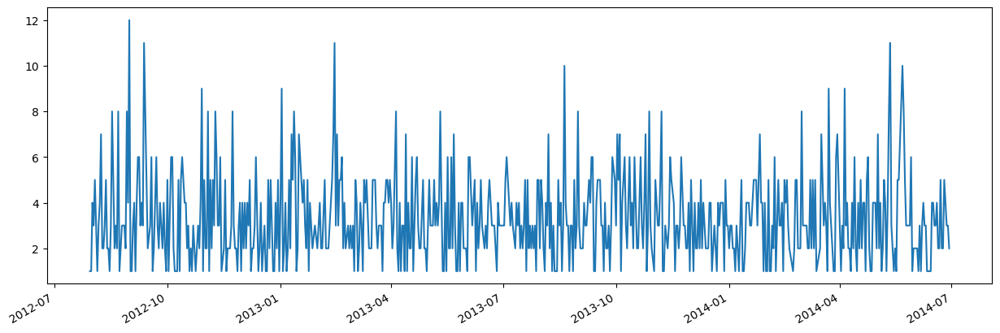

In [60]:
df_marketing_campaign['Dt_Customer'].value_counts().plot(figsize=(15,5))

In [61]:
df_marketing_campaign['Dt_Customer_diff_days'] = (df_marketing_campaign['Dt_Customer'] - df_marketing_campaign['Dt_Customer'].min()).dt.days

In [62]:
df_marketing_campaign[['Dt_Customer','Dt_Customer_diff_days']]

,Dt_Customer,Dt_Customer_diff_days
0,2012-09-04,36
1,2014-03-08,586
2,2013-08-21,387
3,2014-02-10,560
4,2014-01-19,538
...,...,...
2235,2013-06-13,318
2236,2014-06-10,680
2237,2014-01-25,544
2238,2014-01-24,543


In [63]:
df_marketing_campaign.drop(columns=['Dt_Customer'], inplace=True)

Let's see how the histograms look now after all the changes

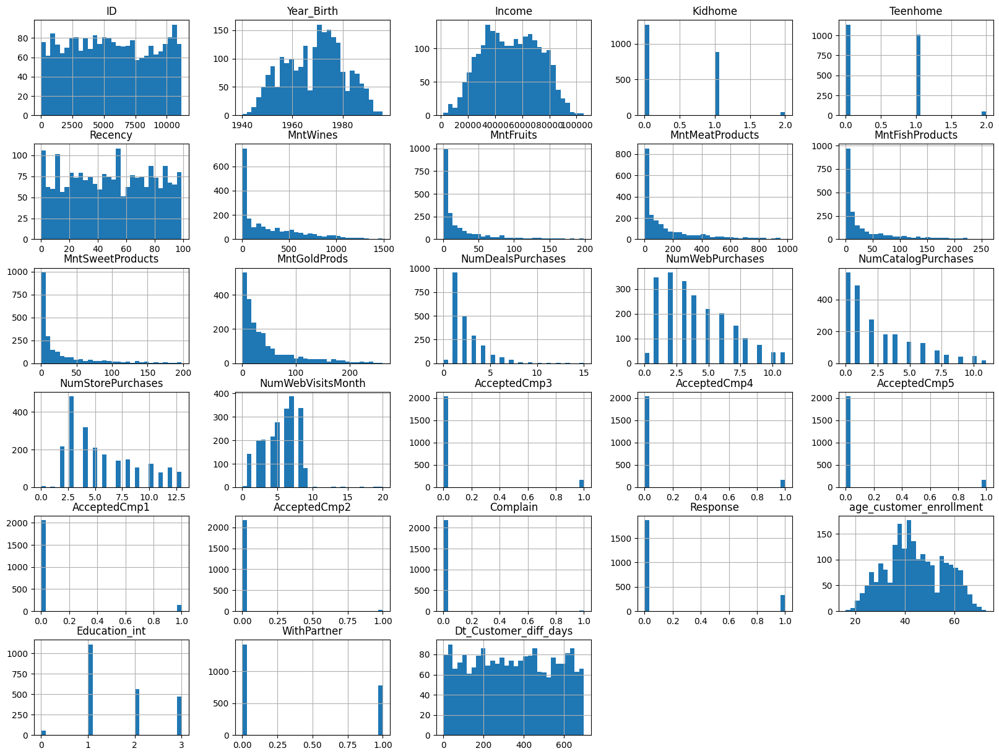

In [64]:
df_marketing_campaign.hist(bins=30, figsize=(20, 15))
plt.show()

## Looking for Duplicates

In [65]:
df_marketing_campaign['ID'].value_counts().sort_values()

5524     1
5324     1
7446     1
965      1
6177     1
        ..
7004     1
10084    1
4201     1
10870    1
9405     1
Name: ID, Length: 2197, dtype: int64

In [66]:
df_marketing_campaign[df_marketing_campaign.duplicated()]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,age_customer_enrollment,Education_int,WithPartner,Dt_Customer_diff_days


## New columns (Feature Engineering)

Sum of all the Mnt columns representing the total amount spent an all products.

In [67]:
columns_keep = df_marketing_campaign.columns.str.contains('Mnt')
df_marketing_campaign['MntTotalSpent'] = df_marketing_campaign.loc[:,columns_keep].sum(axis=1)

Sum of all the Purchases columns representing the total number of purchases made through all the different ways.

In [68]:
columns_keep = df_marketing_campaign.columns.str.contains('Purchases')
df_marketing_campaign['NumTotalPurchases'] = df_marketing_campaign.loc[:,columns_keep].sum(axis=1)

In [69]:
columns_keep = df_marketing_campaign.columns.str.contains('Purchases')

min_value = (df_marketing_campaign['NumTotalPurchases'] - df_marketing_campaign['NumDealsPurchases']).min()
df_marketing_campaign.loc[(df_marketing_campaign['NumTotalPurchases'] - df_marketing_campaign['NumDealsPurchases'] == min_value), columns_keep]

,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumTotalPurchases
981,0,0,0,0,0
1245,15,0,0,0,15
1524,0,0,0,0,0
1846,15,0,0,0,15


In [70]:
df_marketing_campaign.loc[(df_marketing_campaign['NumTotalPurchases'] == 0)]


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,age_customer_enrollment,Education_int,WithPartner,Dt_Customer_diff_days,MntTotalSpent,NumTotalPurchases
981,3955,1965,Graduation,Divorced,4861.0,0,0,20,2,1,1,1,0,1,...,14,0,0,0,0,0,0,0,49,1.0,1,692,6,0
1524,11110,1973,Graduation,Single,3502.0,1,0,56,2,1,1,0,0,1,...,14,0,0,0,0,0,0,0,40,1.0,1,257,5,0


There are customers that have spent on products but never made a purchase. We drop those cases because they don't make sense. Though, in a real case scenario, this detection could be informed to discover the origin of these cases and fix where appropiate in the data collection.


In [71]:
index_to_drop = df_marketing_campaign.loc[(df_marketing_campaign['NumTotalPurchases'] == 0)].index
df_marketing_campaign.drop(index=index_to_drop, axis=0, inplace=True)

Accepted any campaigns column.

In [72]:
columns_keep = (df_marketing_campaign.columns.str.contains('Accepted') | df_marketing_campaign.columns.str.contains('Response'))

df_marketing_campaign['AcceptedOfferAnyCmp'] = df_marketing_campaign.loc[:,columns_keep].any(axis=1).astype(int)

Column to determine if is parent or not.

In [73]:
columns_keep = df_marketing_campaign.columns.str.contains('home')
df_marketing_campaign['IsParent'] = df_marketing_campaign.loc[:,columns_keep].any(axis=1).astype(int)

Product category most and least spent. After the changes we save the orginal columns in another dataframe and then we drop them.

In [74]:
columns_keep = [
    'MntWines', 
    'MntFruits', 
    'MntMeatProducts', 
    'MntFishProducts', 
    'MntSweetProducts', 
    'MntGoldProds'
]
is_max = df_marketing_campaign[columns_keep].eq(df_marketing_campaign[columns_keep].max(axis=1), axis=0)
df_marketing_campaign['ProductMostSpent'] = is_max.dot(df_marketing_campaign[columns_keep].columns)
df_marketing_campaign.loc[is_max.sum(axis=1)> 1, ['ProductMostSpent']] = 'MoreThanOne'

is_min = df_marketing_campaign[columns_keep].eq(df_marketing_campaign[columns_keep].min(axis=1), axis=0)
df_marketing_campaign['ProductLeastSpent'] = is_min.dot(df_marketing_campaign[columns_keep].columns)
df_marketing_campaign.loc[is_min.sum(axis=1)> 1, ['ProductLeastSpent']] = 'MoreThanOne'

df_marketing_campaign[[
    'MntWines', 
    'MntFruits', 
    'MntMeatProducts', 
    'MntFishProducts', 
    'MntSweetProducts', 
    'MntGoldProds',
    'ProductLeastSpent'
]]

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,ProductLeastSpent
0,635,88,546,172,88,88,MoreThanOne
1,11,1,6,2,1,6,MoreThanOne
2,426,49,127,111,21,42,MntSweetProducts
3,11,4,20,10,3,5,MntSweetProducts
4,173,43,118,46,27,15,MntGoldProds
...,...,...,...,...,...,...,...
2235,709,43,182,42,118,247,MntFishProducts
2236,406,0,30,0,0,8,MoreThanOne
2237,908,48,217,32,12,24,MntSweetProducts
2238,428,30,214,80,30,61,MoreThanOne


In [75]:
# Order for Ordinal Encoder
print(df_marketing_campaign[columns_keep].sum().sort_values().index)

Index(['MntFruits', 'MntSweetProducts', 'MntFishProducts', 'MntGoldProds',
       'MntMeatProducts', 'MntWines'],
      dtype='object')


In [76]:
categories = [['MoreThanOne', *df_marketing_campaign[columns_keep].sum().sort_values().index]]
oe_encoder = OrdinalEncoder(categories= categories)
df_marketing_campaign['ProductMostSpent_int'] = oe_encoder.fit_transform(df_marketing_campaign[['ProductMostSpent']])
df_marketing_campaign['ProductLeastSpent_int'] = oe_encoder.fit_transform(df_marketing_campaign[['ProductLeastSpent']])


In [77]:
df_marketing_campaign[[
    'MntWines', 
    'MntFruits', 
    'MntMeatProducts', 
    'MntFishProducts', 
    'MntSweetProducts', 
    'MntGoldProds',
    'ProductMostSpent',
    'ProductMostSpent_int',
    'ProductLeastSpent',
    'ProductLeastSpent_int'
]].head(10)

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,ProductMostSpent,ProductMostSpent_int,ProductLeastSpent,ProductLeastSpent_int
0,635,88,546,172,88,88,MntWines,6.0,MoreThanOne,0.0
1,11,1,6,2,1,6,MntWines,6.0,MoreThanOne,0.0
2,426,49,127,111,21,42,MntWines,6.0,MntSweetProducts,2.0
3,11,4,20,10,3,5,MntMeatProducts,5.0,MntSweetProducts,2.0
4,173,43,118,46,27,15,MntWines,6.0,MntGoldProds,4.0
5,520,42,98,0,42,14,MntWines,6.0,MntFishProducts,3.0
6,235,65,164,50,49,27,MntWines,6.0,MntGoldProds,4.0
7,76,10,56,3,1,23,MntWines,6.0,MntSweetProducts,2.0
8,14,0,24,3,3,2,MntMeatProducts,5.0,MntFruits,1.0
9,28,0,6,1,1,13,MntWines,6.0,MntFruits,1.0


In [78]:
df_saved_columns = df_marketing_campaign[columns_keep].copy()
df_marketing_campaign.drop(
    columns = [
        'MntWines', 
        'MntFruits', 
        'MntMeatProducts', 
        'MntFishProducts', 
        'MntSweetProducts', 
        'MntGoldProds'
    ],
    inplace = True
)

Decade born column. We also save in another dataframe `Year_Birth` and `age_customer_enrollment` and then we drop them.

In [79]:
df_marketing_campaign['Decade_Born'] = ((df_marketing_campaign['Year_Birth']-1900)//10)*10

# df_saved_columns = df_marketing_campaign[['Year_Birth', 'age_customer_enrollment']].copy()
df_saved_columns = pd.concat([df_saved_columns, df_marketing_campaign[['Year_Birth', 'age_customer_enrollment']]], axis=1)
df_marketing_campaign.drop(columns=['age_customer_enrollment'], inplace=True)
df_marketing_campaign.drop(columns=['Year_Birth'], inplace=True)

# Correlation Matrix and Displots

In [80]:
df_marketing_campaign_num = df_marketing_campaign.drop(columns=['ID']).select_dtypes(exclude='object')

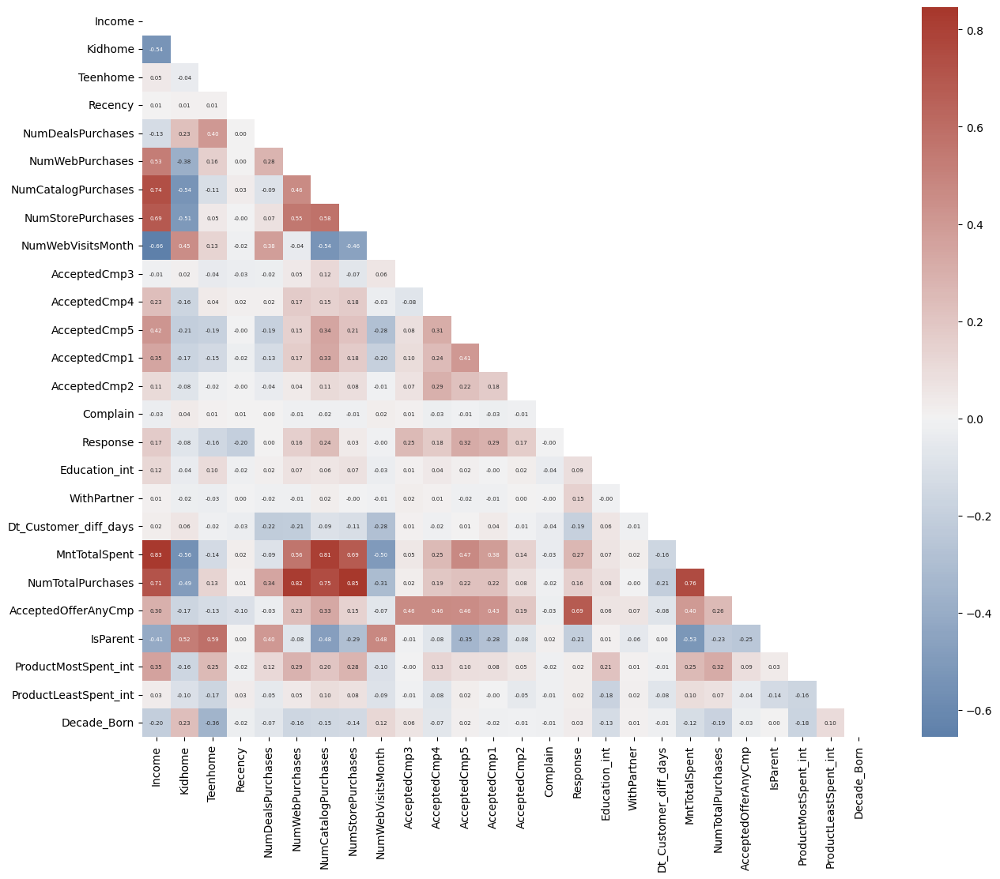

In [81]:
matrix = df_marketing_campaign_num.corr()

cmap = sns.diverging_palette(250, 15, s=75, l=40,
                          n=9, center="light", as_cmap=True)
mask = np.triu(np.ones_like(matrix, dtype=bool))

fig, ax = plt.subplots(figsize=(16,12))

sns.heatmap(matrix, 
    mask=mask, 
    center=0, 
    annot=True, 
    fmt='.2f', 
    square=True, 
    cmap=cmap, 
    ax=ax, 
    annot_kws={"fontsize":5}
)
plt.show()

#### More than 0.5

In [82]:
matrix_2 = matrix.copy()
_ = np.round(matrix_2[(matrix_2 > 0.5)].values, 2)
_[np.tril_indices(_.shape[0], 0)] = np.nan
matrix_2[:] = _
dict_corr_greater_05 = dict(matrix_2.stack().items())

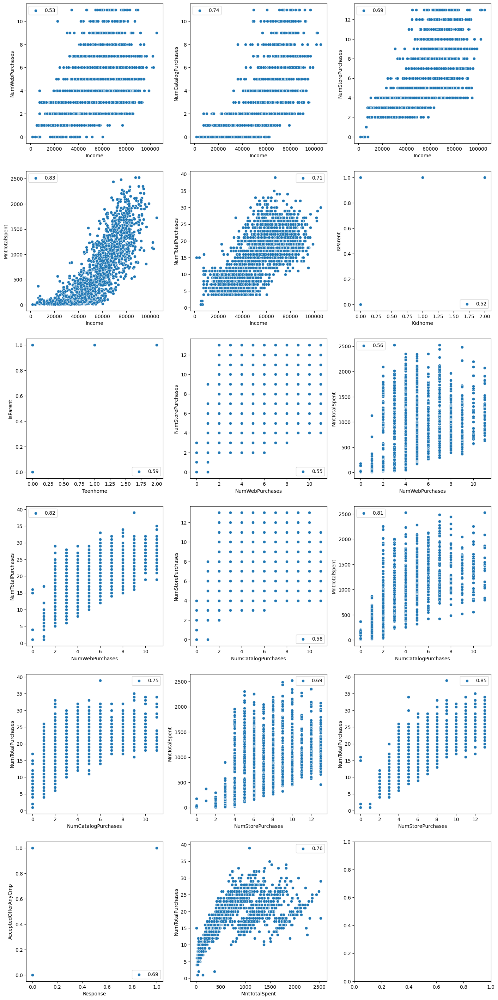

In [83]:
n_cols =  3
n_rows = int(np.ceil((len(dict_corr_greater_05) / n_cols)))
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(17, (n_rows*6)))

for i, ((x, y), value) in enumerate(dict_corr_greater_05.items()):
       sns.scatterplot(
              data=df_marketing_campaign[[x, y]], 
              x=x, 
              y=y,
              ax=axes[i//n_cols,i%n_cols]
       )
       axes[i//n_cols,i%n_cols].legend([value])

#### Less than - 0.5

In [84]:
matrix_2 = matrix.copy()
_ = np.round(matrix_2[(matrix_2 < -0.5)].values, 2)
_[np.tril_indices(_.shape[0], 0)] = np.nan
matrix_2[:] = _
dict_corr_less_minus05 = dict(matrix_2.stack().items())

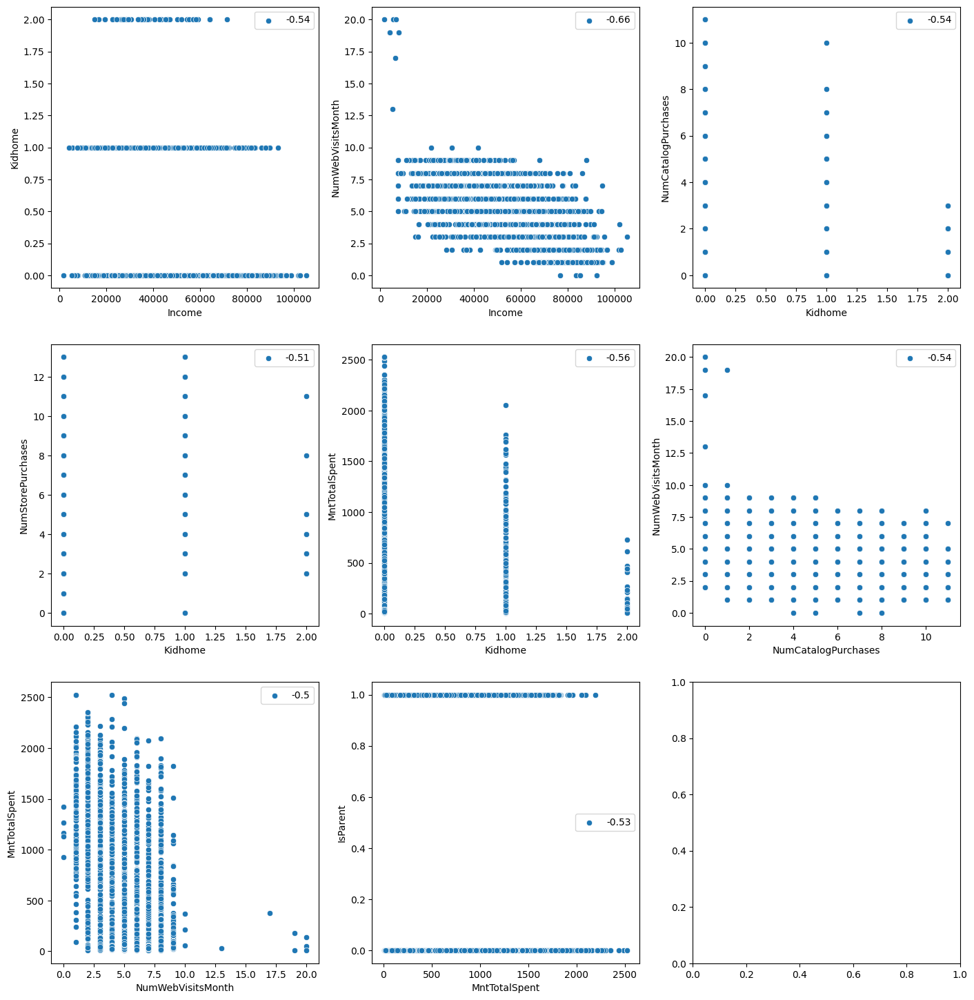

In [85]:
n_cols =  3
n_rows = int(np.ceil((len(dict_corr_less_minus05) / n_cols)))
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(17, (n_rows*6)))

for i, ((x, y), value) in enumerate(dict_corr_less_minus05.items()):
       sns.scatterplot(
              data=df_marketing_campaign[[x, y]], 
              x=x, 
              y=y,
              ax=axes[i//n_cols,i%n_cols]
       )
       axes[i//n_cols,i%n_cols].legend([value])
       

# Standardization

In [86]:
standard_scaler = StandardScaler()

array_marketing_campaign_num_scaled = standard_scaler.fit_transform(df_marketing_campaign_num)

In [87]:
df_marketing_campaign_num_scaled =  pd.DataFrame(array_marketing_campaign_num_scaled, columns=df_marketing_campaign_num.columns)
df_marketing_campaign_num_scaled.head()

,Income,Kidhome,Teenhome,Recency,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Education_int,WithPartner,Dt_Customer_diff_days,MntTotalSpent,NumTotalPurchases,AcceptedOfferAnyCmp,IsParent,ProductMostSpent_int,ProductLeastSpent_int,Decade_Born
0,0.313555,-0.825007,-0.931925,0.308555,0.366871,1.494875,2.683791,-0.568288,0.694596,-0.283225,-0.284163,-0.2804,-0.262005,-0.117715,-0.095893,2.373061,-0.788228,1.353609,-1.527862,1.678580,1.336805,1.626708,-1.586704,0.509802,-1.151947,-1.200280
1,-0.259540,1.036134,0.907621,-0.383393,-0.169269,-1.171569,-0.596435,-1.186574,-0.141509,-0.283225,-0.284163,-0.2804,-0.262005,-0.117715,-0.095893,-0.421397,-0.788228,1.353609,1.189482,-0.963521,-1.169554,-0.614738,0.630237,0.509802,-1.151947,-1.200280
2,0.968333,-0.825007,-0.931925,-0.798562,-0.705409,1.494875,-0.231965,1.286571,-0.559562,-0.283225,-0.284163,-0.2804,-0.262005,-0.117715,-0.095893,-0.421397,-0.788228,-0.738766,0.206298,0.281091,0.809151,-0.614738,-1.586704,0.509802,0.179556,-0.364425
3,-1.216706,1.036134,-0.931925,-0.798562,-0.169269,-0.790649,-0.960904,-0.568288,0.276543,-0.283225,-0.284163,-0.2804,-0.262005,-0.117715,-0.095893,-0.421397,-0.788228,-0.738766,1.061026,-0.920317,-0.905727,-0.614738,0.630237,-0.341160,0.179556,1.307285
4,0.321087,1.036134,-0.931925,1.554063,1.439152,0.352113,0.132504,0.049998,-0.141509,-0.283225,-0.284163,-0.2804,-0.262005,-0.117715,-0.095893,-0.421397,1.596556,-0.738766,0.952332,-0.307150,0.545323,-0.614738,0.630237,0.509802,1.511059,1.307285


In [88]:
df_marketing_campaign_num_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Income,2195.0,2.589677e-17,1.000228,-2.427426,-0.796968,-0.015365,0.807275,2.613564
Kidhome,2195.0,7.445323e-17,1.000228,-0.825007,-0.825007,-0.825007,1.036134,2.897276
Teenhome,2195.0,5.826774e-17,1.000228,-0.931925,-0.931925,-0.931925,0.907621,2.747167
Recency,2195.0,-5.583992e-17,1.000228,-1.698095,-0.867757,-0.002821,0.862114,1.727050
NumDealsPurchases,2195.0,-2.913387e-17,1.000228,-1.241549,-0.705409,-0.169269,0.366871,6.800554
NumWebPurchases,2195.0,-9.711290e-17,1.000228,-1.552490,-0.790649,-0.028808,0.733034,2.637637
NumCatalogPurchases,2195.0,6.474193e-18,1.000228,-0.960904,-0.960904,-0.231965,0.496974,3.048260
NumStorePurchases,2195.0,-2.144577e-17,1.000228,-1.804861,-0.877431,-0.259145,0.668284,2.214000
NumWebVisitsMonth,2195.0,8.740161e-17,1.000228,-2.231773,-0.977615,0.276543,0.694596,6.129283
AcceptedCmp3,2195.0,1.861331e-17,1.000228,-0.283225,-0.283225,-0.283225,-0.283225,3.530759


# PCA

In [89]:
pca = PCA()
pca.fit(df_marketing_campaign_num_scaled)

PCA()

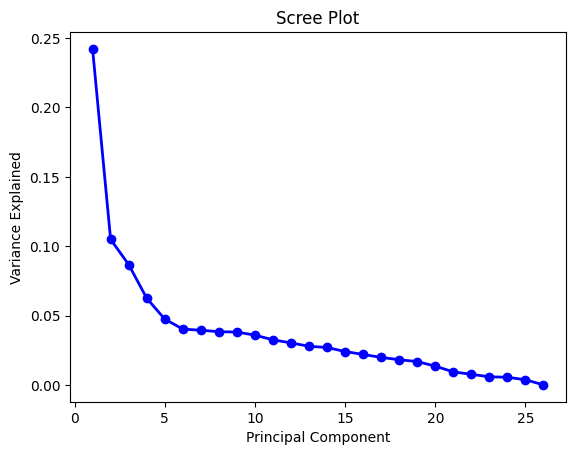

In [90]:
PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

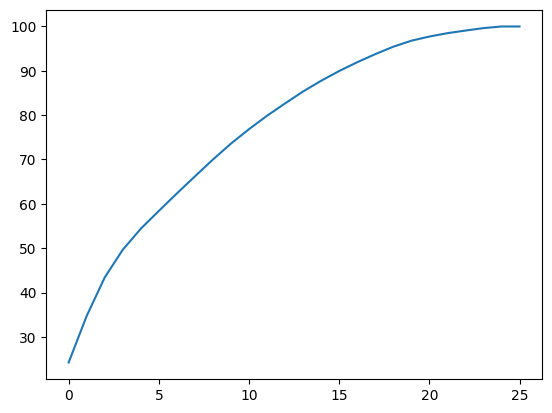

In [91]:
plt.plot(np.cumsum(np.round(pca.explained_variance_ratio_, 4)*100))


In [92]:
array_marketing_campaign_num_scaled_pca = pca.transform(df_marketing_campaign_num_scaled)
df_marketing_campaign_num_scaled_pca2 = pd.DataFrame(array_marketing_campaign_num_scaled_pca).iloc[:,0:2]
df_marketing_campaign_num_scaled_pca3 = pd.DataFrame(array_marketing_campaign_num_scaled_pca).iloc[:,0:3]
df_marketing_campaign_num_scaled_pca4 = pd.DataFrame(array_marketing_campaign_num_scaled_pca).iloc[:,0:4]
df_marketing_campaign_num_scaled_pca5 = pd.DataFrame(array_marketing_campaign_num_scaled_pca).iloc[:,0:5]

[]

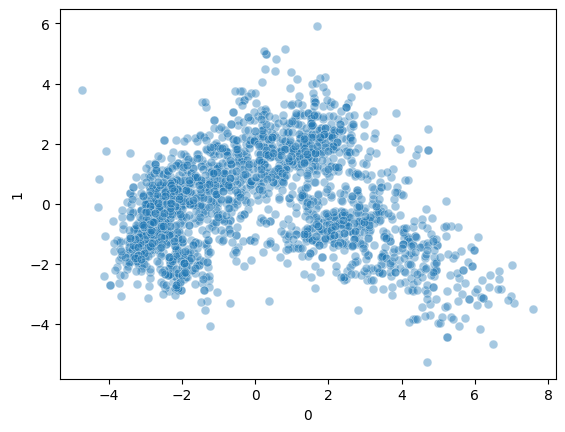

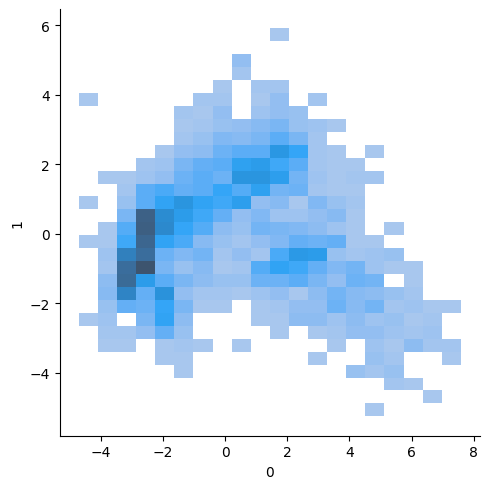

In [93]:
sns.scatterplot(
    df_marketing_campaign_num_scaled_pca2, 
    x=0, 
    y=1,
    alpha=0.4,
    s=40
)

sns.displot(
    df_marketing_campaign_num_scaled_pca2, 
    x=0, 
    y=1
)
plt.plot()

In [93]:
fig_3d = px.scatter_3d(
    df_marketing_campaign_num_scaled_pca3, x=0, y=1, z=2
)

fig_3d.show()

# Clustering

## K-Means

### With PCA (2, 3, 4, 5 components)

In [95]:
sum_of_squared_distances_pca3 = []
silhouette_scores_pca3 = []
sum_of_squared_distances_pca2 = []
silhouette_scores_pca2 = []
sum_of_squared_distances_pca4 = []
silhouette_scores_pca4 = []
sum_of_squared_distances_pca5 = []
silhouette_scores_pca5 = []
k = range(2,10)
for _ in k:
  kmeans_model_pca2 = KMeans(n_clusters=_, n_init='auto')
  kmeans_model_pca3 = KMeans(n_clusters=_, n_init='auto')
  kmeans_model_pca4 = KMeans(n_clusters=_, n_init='auto')
  kmeans_model_pca5 = KMeans(n_clusters=_, n_init='auto')
  y_pca2 = kmeans_model_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
  y_pca3 = kmeans_model_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
  y_pca4 = kmeans_model_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
  y_pca5 = kmeans_model_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
  sum_of_squared_distances_pca2.append(kmeans_model_pca2.inertia_)
  sum_of_squared_distances_pca3.append(kmeans_model_pca3.inertia_)
  sum_of_squared_distances_pca4.append(kmeans_model_pca4.inertia_)
  sum_of_squared_distances_pca5.append(kmeans_model_pca5.inertia_)
  silhouette_scores_pca2.append(silhouette_score(df_marketing_campaign_num_scaled_pca2, y_pca2))
  silhouette_scores_pca3.append(silhouette_score(df_marketing_campaign_num_scaled_pca3, y_pca3))
  silhouette_scores_pca4.append(silhouette_score(df_marketing_campaign_num_scaled_pca4, y_pca4))
  silhouette_scores_pca5.append(silhouette_score(df_marketing_campaign_num_scaled_pca5, y_pca5))

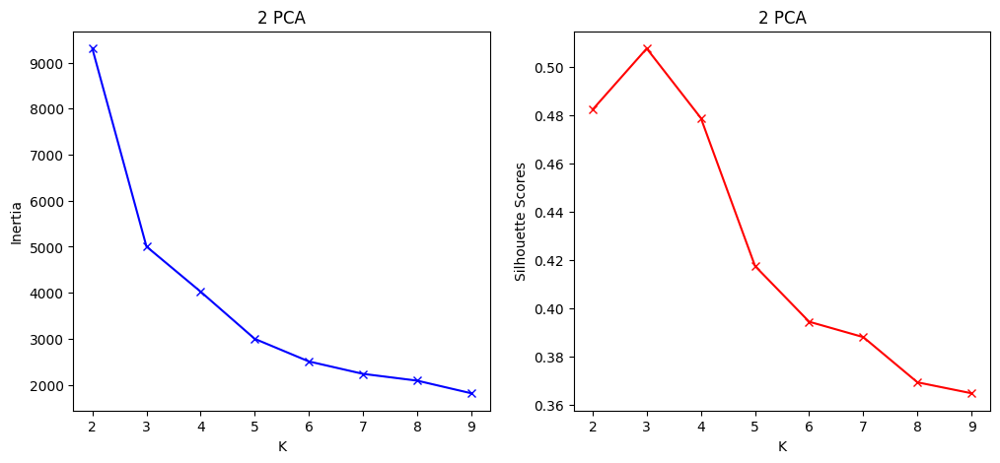

In [96]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12,5))
# plt.figure(figsize=(8,8))
axes[0].plot(k, sum_of_squared_distances_pca2, 'bx-')
axes[0].set_title('2 PCA')
axes[0].set_xlabel('K')
axes[0].set_ylabel('Inertia')

axes[1].plot(k, silhouette_scores_pca2, 'rx-')
axes[1].set_title('2 PCA')
axes[1].set_xlabel('K')
axes[1].set_ylabel('Silhouette Scores')

plt.show()

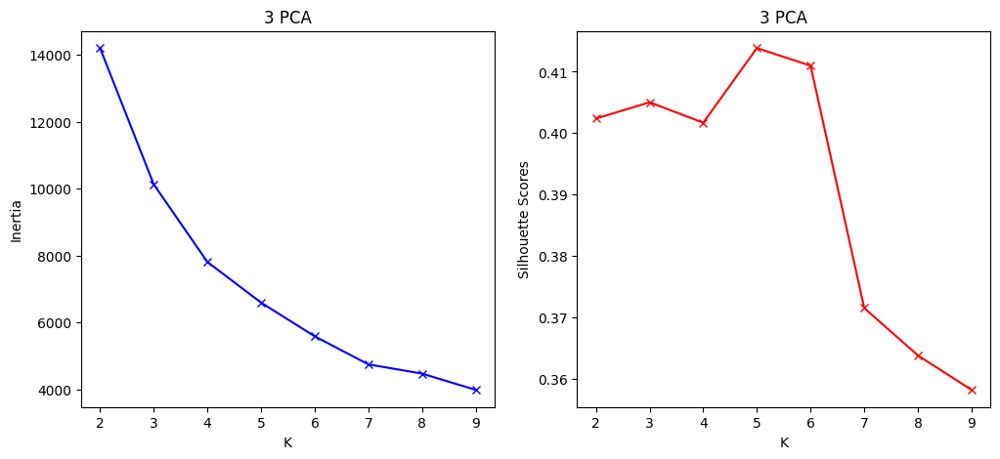

In [97]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12,5))
# plt.figure(figsize=(8,8))
axes[0].plot(k, sum_of_squared_distances_pca3, 'bx-')
axes[0].set_title('3 PCA')
axes[0].set_xlabel('K')
axes[0].set_ylabel('Inertia')

axes[1].plot(k, silhouette_scores_pca3, 'rx-')
axes[1].set_title('3 PCA')
axes[1].set_xlabel('K')
axes[1].set_ylabel('Silhouette Scores')

plt.show()

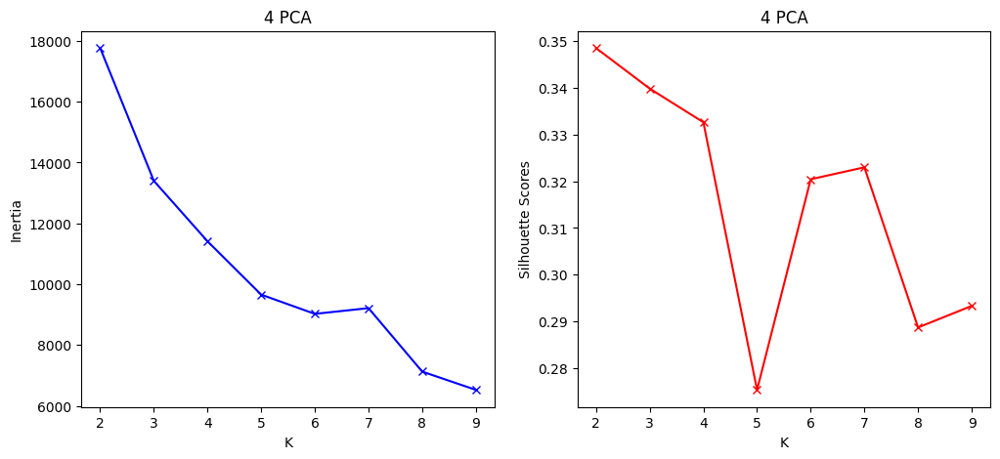

In [98]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12,5))
# plt.figure(figsize=(8,8))
axes[0].plot(k, sum_of_squared_distances_pca4, 'bx-')
axes[0].set_title('4 PCA')
axes[0].set_xlabel('K')
axes[0].set_ylabel('Inertia')

axes[1].plot(k, silhouette_scores_pca4, 'rx-')
axes[1].set_title('4 PCA')
axes[1].set_xlabel('K')
axes[1].set_ylabel('Silhouette Scores')

plt.show()

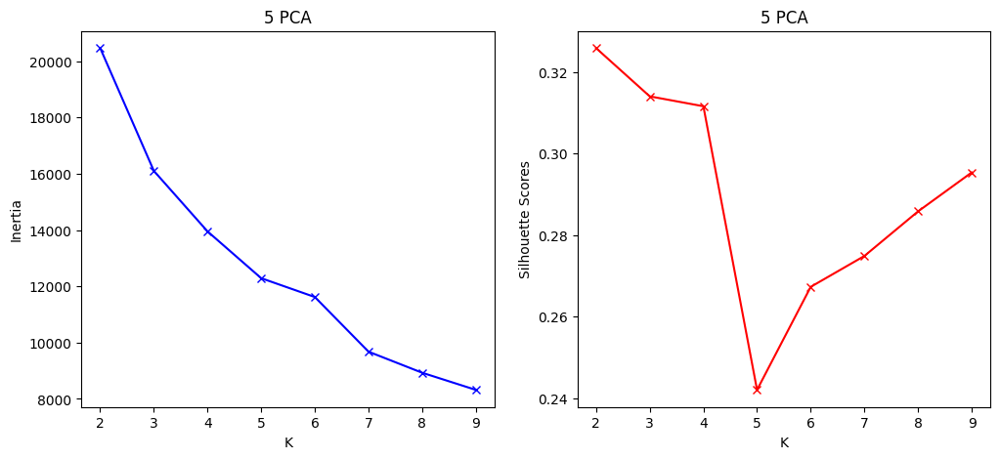

In [99]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12,5))
# plt.figure(figsize=(8,8))
axes[0].plot(k, sum_of_squared_distances_pca5, 'bx-')
axes[0].set_title('5 PCA')
axes[0].set_xlabel('K')
axes[0].set_ylabel('Inertia')

axes[1].plot(k, silhouette_scores_pca5, 'rx-')
axes[1].set_title('5 PCA')
axes[1].set_xlabel('K')
axes[1].set_ylabel('Silhouette Scores')

plt.show()

In [100]:
kmeans_model_pca2 = KMeans(n_clusters=3, n_init='auto')
y_pca2 = kmeans_model_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
print(silhouette_score(df_marketing_campaign_num_scaled_pca2,y_pca2))

0.5074112405496717


In [101]:
kmeans_model_pca3 = KMeans(n_clusters=3, n_init='auto')
y_pca3 = kmeans_model_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
print(silhouette_score(df_marketing_campaign_num_scaled_pca3,y_pca3))

0.4080302572511736


In [102]:
kmeans_model_pca4 = KMeans(n_clusters=3, n_init='auto')
y_pca4 = kmeans_model_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
print(silhouette_score(df_marketing_campaign_num_scaled_pca4,y_pca4))

0.34056961161630406


In [103]:
kmeans_model_pca5 = KMeans(n_clusters=3, n_init='auto')
y_pca5 = kmeans_model_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
print(silhouette_score(df_marketing_campaign_num_scaled_pca5,y_pca5))

0.3130017910287765


In [104]:
df_marketing_campaign['kmeans_pca2'] = y_pca2

kmeans_pca2


0    986
2    696
1    513
Name: kmeans_pca2, dtype: int64


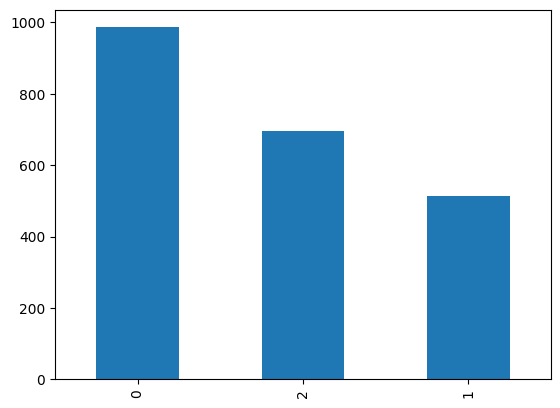

In [105]:
print('kmeans_pca2')
print('\n')
print(df_marketing_campaign['kmeans_pca2'].value_counts())
df_marketing_campaign['kmeans_pca2'].value_counts().plot(kind='bar')
plt.show()
print('\n')

In [106]:
fig_2d = px.scatter(
    df_marketing_campaign_num_scaled_pca2, x=0, y=1,
    color=kmeans_model_pca2.labels_, labels={'color': 'class'}
)

fig_2d.show()

<AxesSubplot: xlabel='0', ylabel='1'>

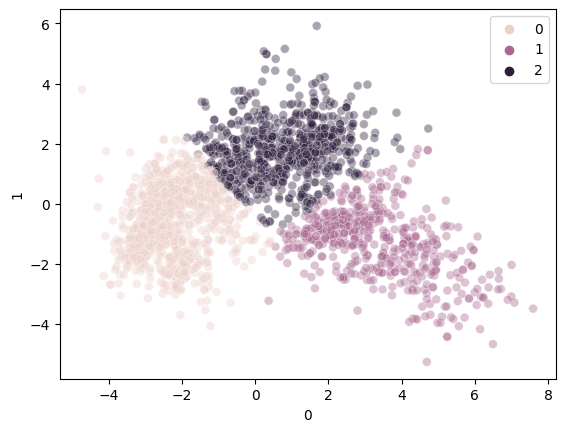

In [107]:
sns.scatterplot(
    df_marketing_campaign_num_scaled_pca2, 
    x=0, 
    y=1,
    hue=kmeans_model_pca2.labels_,
    alpha=0.4,
    s=40
)

### Without PCA

In [108]:
sum_of_squared_distances = []
silhouette_scores = []
k = range(2,15)
for _ in k:
  kmeans_model = KMeans(n_clusters=_, n_init='auto')
  y = kmeans_model.fit_predict(df_marketing_campaign_num_scaled)
  sum_of_squared_distances.append(kmeans_model.inertia_)
  silhouette_scores.append(silhouette_score(df_marketing_campaign_num_scaled, y))
  

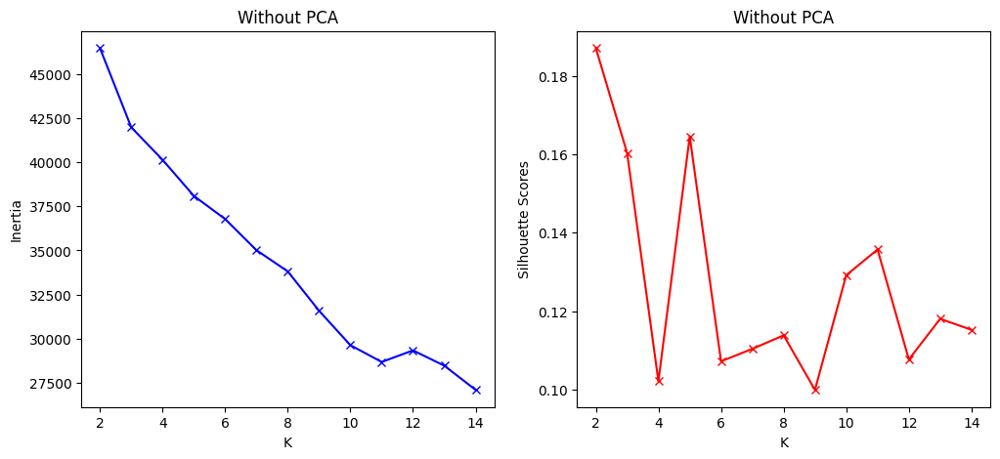

In [109]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12,5))
# plt.figure(figsize=(8,8))
axes[0].plot(k, sum_of_squared_distances, 'bx-')
axes[0].set_title('Without PCA')
axes[0].set_xlabel('K')
axes[0].set_ylabel('Inertia')

axes[1].plot(k, silhouette_scores, 'rx-')
axes[1].set_title('Without PCA')
axes[1].set_xlabel('K')
axes[1].set_ylabel('Silhouette Scores')

plt.show()

In [110]:
kmeans_model = KMeans(n_clusters=3, n_init='auto')
y = kmeans_model.fit_predict(df_marketing_campaign_num_scaled)
print(silhouette_score(df_marketing_campaign_num_scaled,y))

0.15988377087581032


In [111]:
df_marketing_campaign['kmeans'] = y

kmeans


0    1003
2     680
1     512
Name: kmeans, dtype: int64


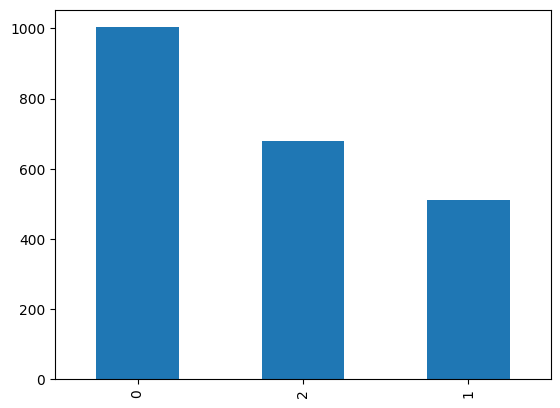

In [112]:
print('kmeans')
print('\n')
print(df_marketing_campaign['kmeans'].value_counts())
df_marketing_campaign['kmeans'].value_counts().plot(kind='bar')
plt.show()
print('\n')

## Agglomerative Clustering

### 2 PCA

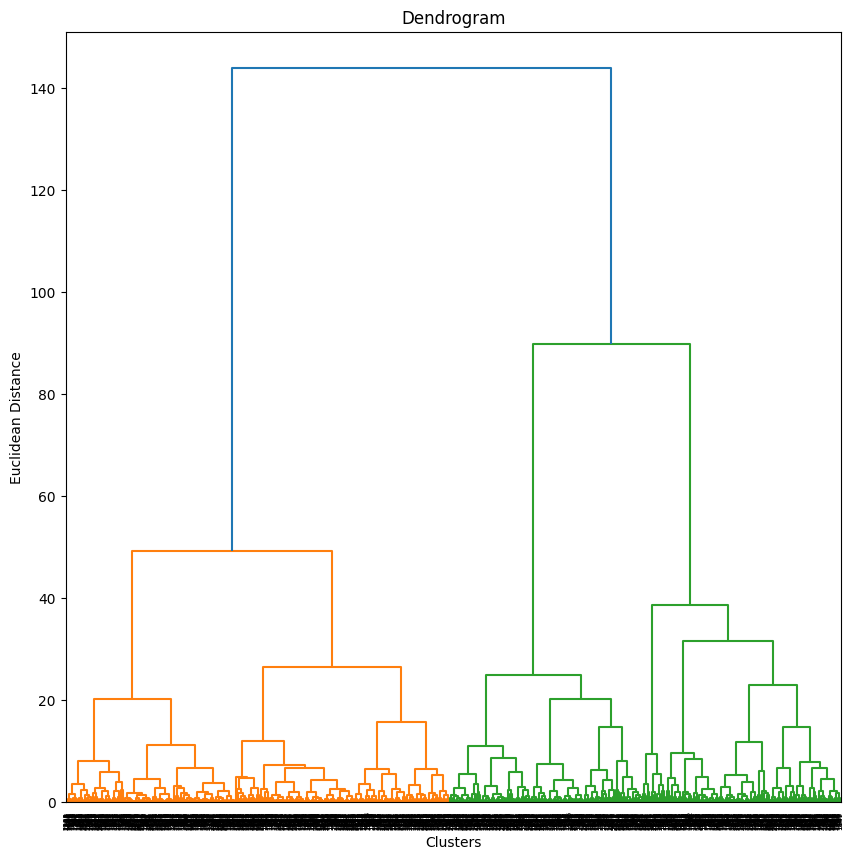

In [113]:
fig = plt.figure(figsize=(10,10))
dendrogram_plot = dendrogram(linkage(df_marketing_campaign_num_scaled_pca2, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Clusters')
plt.ylabel('Euclidean Distance')
plt.show()

In [114]:
agglomerative_model_c2_pca2 = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
agglomerative_model_c3_pca2 = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
agglomerative_model_c4_pca2 = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
agglomerative_model_c5_pca2 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
agglomerative_model_c6_pca2 = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='ward')
agglomerative_model_c7_pca2 = AgglomerativeClustering(n_clusters=7, metric='euclidean', linkage='ward')
agglomerative_model_c8_pca2 = AgglomerativeClustering(n_clusters=8, metric='euclidean', linkage='ward')
agglomerative_model_c9_pca2 = AgglomerativeClustering(n_clusters=9, metric='euclidean', linkage='ward')

y_c2_pca2 = agglomerative_model_c2_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
y_c3_pca2 = agglomerative_model_c3_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
y_c4_pca2 = agglomerative_model_c4_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
y_c5_pca2 = agglomerative_model_c5_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
y_c6_pca2 = agglomerative_model_c6_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
y_c7_pca2 = agglomerative_model_c7_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
y_c8_pca2 = agglomerative_model_c8_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)
y_c9_pca2 = agglomerative_model_c9_pca2.fit_predict(df_marketing_campaign_num_scaled_pca2)

print(f'2 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca2,y_c2_pca2)}')
print(f'3 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca2,y_c3_pca2)}')
print(f'4 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca2,y_c4_pca2)}')
print(f'5 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca2,y_c5_pca2)}')
print(f'6 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca2,y_c6_pca2)}')
print(f'7 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca2,y_c7_pca2)}')
print(f'8 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca2,y_c8_pca2)}')
print(f'9 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca2,y_c9_pca2)}')

df_marketing_campaign['ac_pca2'] = y_c3_pca2

2 clusters: 0.4764817212905356
3 clusters: 0.4906330840635416
4 clusters: 0.41258204375312596
5 clusters: 0.39084740479089247
6 clusters: 0.36962438262864966
7 clusters: 0.341190982134494
8 clusters: 0.3167146606709145
9 clusters: 0.3263818577046689


In [115]:
# df_marketing_campaign_num_scaled_pca2['kmeans_pca2'] = df_marketing_campaign['kmeans_pca2']
fig_2d = px.scatter(
    df_marketing_campaign_num_scaled_pca2, x=0, y=1,
    color=agglomerative_model_c3_pca2.labels_, labels={'color': 'class'}
)

fig_2d.show()

<AxesSubplot: xlabel='0', ylabel='1'>

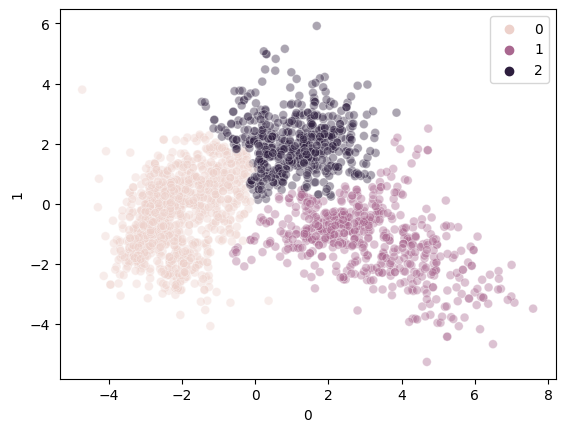

In [116]:
sns.scatterplot(
    df_marketing_campaign_num_scaled_pca2, 
    x=0, 
    y=1,
    hue=agglomerative_model_c3_pca2.labels_,
    alpha=0.4,
    s=40
)

ac_pca2


0    1088
1     562
2     545
Name: ac_pca2, dtype: int64


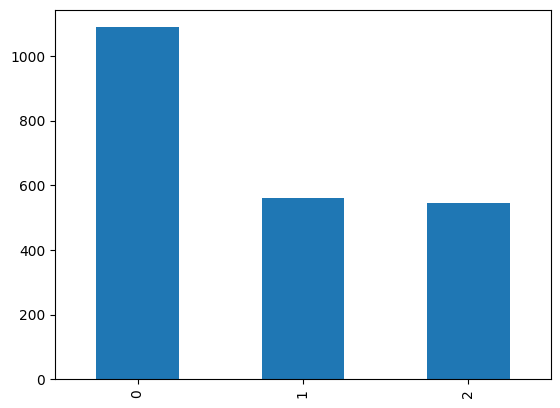

In [117]:
print('ac_pca2')
print('\n')
print(df_marketing_campaign['ac_pca2'].value_counts())
df_marketing_campaign['ac_pca2'].value_counts().plot(kind='bar')
plt.show()
print('\n')

### 3 PCA

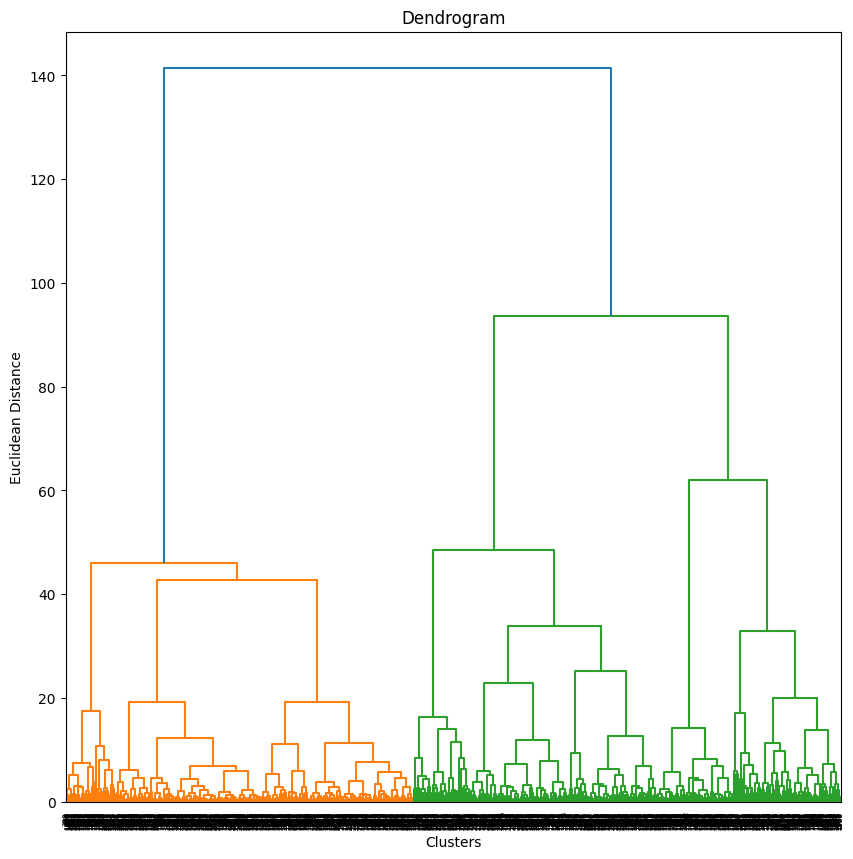

In [118]:
fig = plt.figure(figsize=(10,10))
dendrogram_plot = dendrogram(linkage(df_marketing_campaign_num_scaled_pca3, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Clusters')
plt.ylabel('Euclidean Distance')
plt.show()

In [119]:
agglomerative_model_c2_pca3 = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
agglomerative_model_c3_pca3 = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
agglomerative_model_c4_pca3 = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
agglomerative_model_c5_pca3 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
agglomerative_model_c6_pca3 = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='ward')
agglomerative_model_c7_pca3 = AgglomerativeClustering(n_clusters=7, metric='euclidean', linkage='ward')
agglomerative_model_c8_pca3 = AgglomerativeClustering(n_clusters=8, metric='euclidean', linkage='ward')
agglomerative_model_c9_pca3 = AgglomerativeClustering(n_clusters=9, metric='euclidean', linkage='ward')

y_c2_pca3 = agglomerative_model_c2_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
y_c3_pca3 = agglomerative_model_c3_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
y_c4_pca3 = agglomerative_model_c4_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
y_c5_pca3 = agglomerative_model_c5_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
y_c6_pca3 = agglomerative_model_c6_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
y_c7_pca3 = agglomerative_model_c7_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
y_c8_pca3 = agglomerative_model_c8_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)
y_c9_pca3 = agglomerative_model_c9_pca3.fit_predict(df_marketing_campaign_num_scaled_pca3)

print(f'2 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca3,y_c2_pca3)}')
print(f'3 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca3,y_c3_pca3)}')
print(f'4 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca3,y_c4_pca3)}')
print(f'5 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca3,y_c5_pca3)}')
print(f'6 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca3,y_c6_pca3)}')
print(f'7 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca3,y_c7_pca3)}')
print(f'8 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca3,y_c8_pca3)}')
print(f'9 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca3,y_c9_pca3)}')

df_marketing_campaign['ac_pca3'] = y_c3_pca3

2 clusters: 0.3749883695804647
3 clusters: 0.3782296756652329
4 clusters: 0.3760712486932122
5 clusters: 0.3736721822280367
6 clusters: 0.37088149343847243
7 clusters: 0.33777986357955975
8 clusters: 0.32395432412208147
9 clusters: 0.3269283406705022


ac_pca3


1    986
2    690
0    519
Name: ac_pca3, dtype: int64


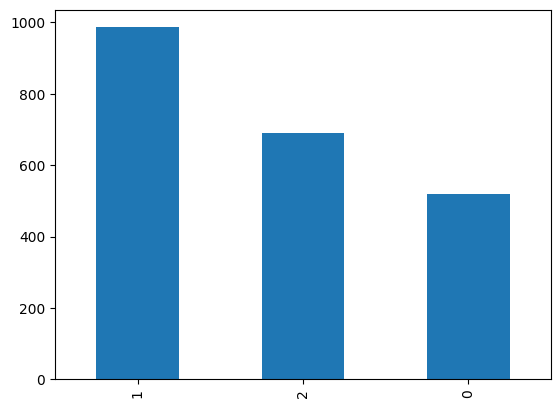

In [120]:
print('ac_pca3')
print('\n')
print(df_marketing_campaign['ac_pca3'].value_counts())
df_marketing_campaign['ac_pca3'].value_counts().plot(kind='bar')
plt.show()
print('\n')

### 4 PCA

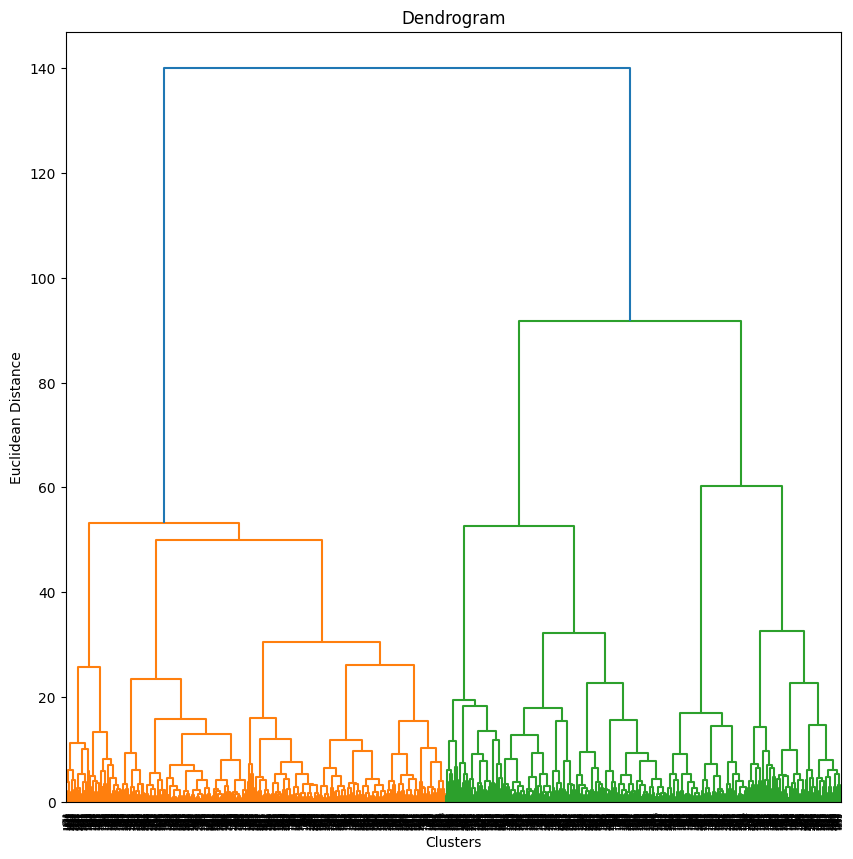

In [121]:
fig = plt.figure(figsize=(10,10))
dendrogram_plot = dendrogram(linkage(df_marketing_campaign_num_scaled_pca4, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Clusters')
plt.ylabel('Euclidean Distance')
plt.show()

In [122]:
agglomerative_model_c2_pca4 = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
agglomerative_model_c3_pca4 = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
agglomerative_model_c4_pca4 = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
agglomerative_model_c5_pca4 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
agglomerative_model_c6_pca4 = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='ward')
agglomerative_model_c7_pca4 = AgglomerativeClustering(n_clusters=7, metric='euclidean', linkage='ward')
agglomerative_model_c8_pca4 = AgglomerativeClustering(n_clusters=8, metric='euclidean', linkage='ward')
agglomerative_model_c9_pca4 = AgglomerativeClustering(n_clusters=9, metric='euclidean', linkage='ward')

y_c2_pca4 = agglomerative_model_c2_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
y_c3_pca4 = agglomerative_model_c3_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
y_c4_pca4 = agglomerative_model_c4_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
y_c5_pca4 = agglomerative_model_c5_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
y_c6_pca4 = agglomerative_model_c6_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
y_c7_pca4 = agglomerative_model_c7_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
y_c8_pca4 = agglomerative_model_c8_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)
y_c9_pca4 = agglomerative_model_c9_pca4.fit_predict(df_marketing_campaign_num_scaled_pca4)

print(f'2 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca4,y_c2_pca4)}')
print(f'3 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca4,y_c3_pca4)}')
print(f'4 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca4,y_c4_pca4)}')
print(f'5 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca4,y_c5_pca4)}')
print(f'6 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca4,y_c6_pca4)}')
print(f'7 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca4,y_c7_pca4)}')
print(f'8 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca4,y_c8_pca4)}')
print(f'9 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca4,y_c9_pca4)}')

df_marketing_campaign['ac_pca4'] = y_c3_pca4

2 clusters: 0.3217764445041826
3 clusters: 0.3211509712265109
4 clusters: 0.3049207271859562
5 clusters: 0.29012906668426997
6 clusters: 0.3040640415381981
7 clusters: 0.2663612401080524
8 clusters: 0.26168905562954264
9 clusters: 0.243804643266958


ac_pca4


1    1078
2     628
0     489
Name: ac_pca4, dtype: int64


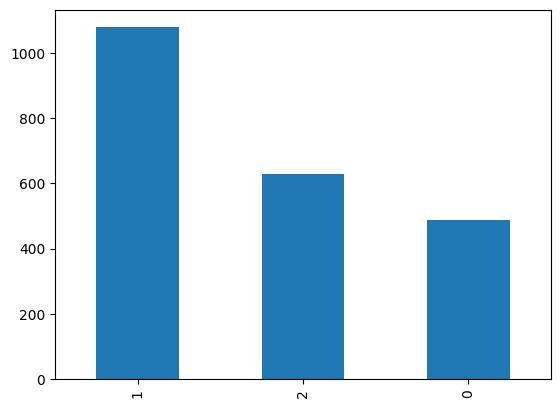

In [123]:
print('ac_pca4')
print('\n')
print(df_marketing_campaign['ac_pca4'].value_counts())
df_marketing_campaign['ac_pca4'].value_counts().plot(kind='bar')
plt.show()
print('\n')

### 5 PCA

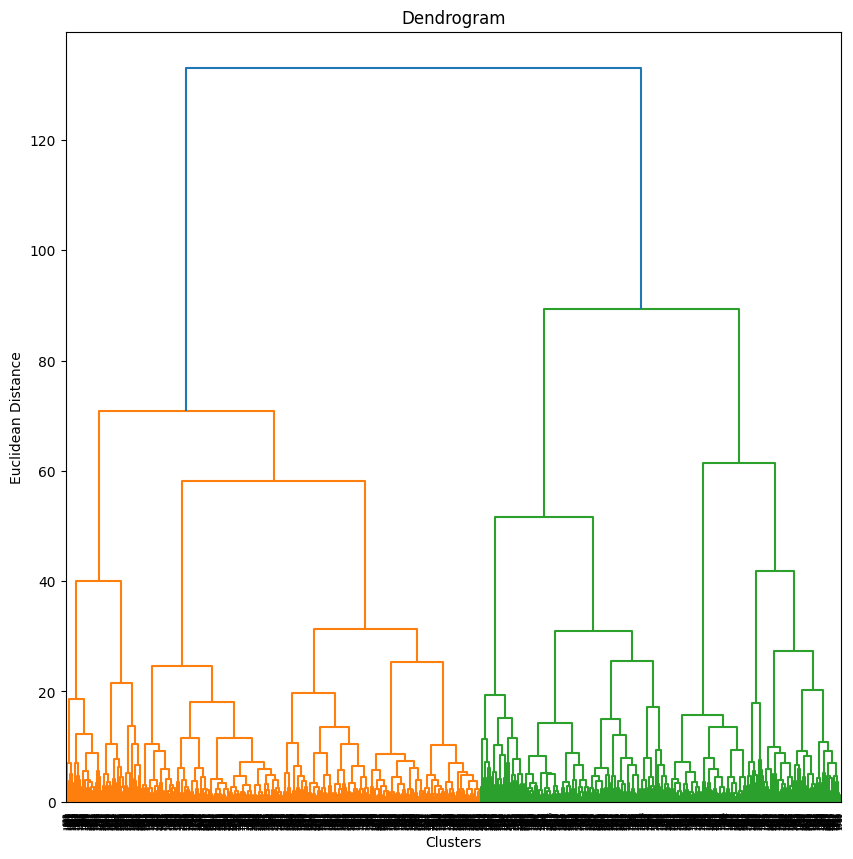

In [124]:
fig = plt.figure(figsize=(10,10))
dendrogram_plot = dendrogram(linkage(df_marketing_campaign_num_scaled_pca5, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Clusters')
plt.ylabel('Euclidean Distance')
plt.show()

In [125]:
agglomerative_model_c2_pca5 = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
agglomerative_model_c3_pca5 = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
agglomerative_model_c4_pca5 = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
agglomerative_model_c5_pca5 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
agglomerative_model_c6_pca5 = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='ward')
agglomerative_model_c7_pca5 = AgglomerativeClustering(n_clusters=7, metric='euclidean', linkage='ward')
agglomerative_model_c8_pca5 = AgglomerativeClustering(n_clusters=8, metric='euclidean', linkage='ward')
agglomerative_model_c9_pca5 = AgglomerativeClustering(n_clusters=9, metric='euclidean', linkage='ward')

y_c2_pca5 = agglomerative_model_c2_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
y_c3_pca5 = agglomerative_model_c3_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
y_c4_pca5 = agglomerative_model_c4_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
y_c5_pca5 = agglomerative_model_c5_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
y_c6_pca5 = agglomerative_model_c6_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
y_c7_pca5 = agglomerative_model_c7_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
y_c8_pca5 = agglomerative_model_c8_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)
y_c9_pca5 = agglomerative_model_c9_pca5.fit_predict(df_marketing_campaign_num_scaled_pca5)

print(f'2 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca5,y_c2_pca5)}')
print(f'3 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca5,y_c3_pca5)}')
print(f'4 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca5,y_c4_pca5)}')
print(f'5 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca5,y_c5_pca5)}')
print(f'6 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca5,y_c6_pca5)}')
print(f'7 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca5,y_c7_pca5)}')
print(f'8 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca5,y_c8_pca5)}')
print(f'9 clusters: {silhouette_score(df_marketing_campaign_num_scaled_pca5,y_c9_pca5)}')

df_marketing_campaign['ac_pca5'] = y_c4_pca5

2 clusters: 0.2831040047677411
3 clusters: 0.2648447515897266
4 clusters: 0.28712618875212026
5 clusters: 0.2735054813028414
6 clusters: 0.22411405972273657
7 clusters: 0.2421818582805023
8 clusters: 0.24954875603166485
9 clusters: 0.26052861006664496


ac_pca5


1    961
2    535
0    483
3    216
Name: ac_pca5, dtype: int64


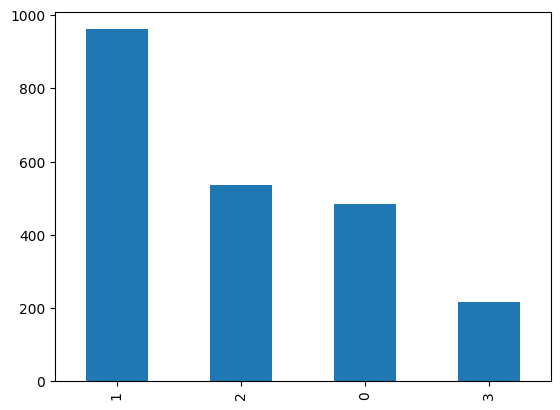

In [126]:
print('ac_pca5')
print('\n')
print(df_marketing_campaign['ac_pca5'].value_counts())
df_marketing_campaign['ac_pca5'].value_counts().plot(kind='bar')
plt.show()
print('\n')

### Without PCA

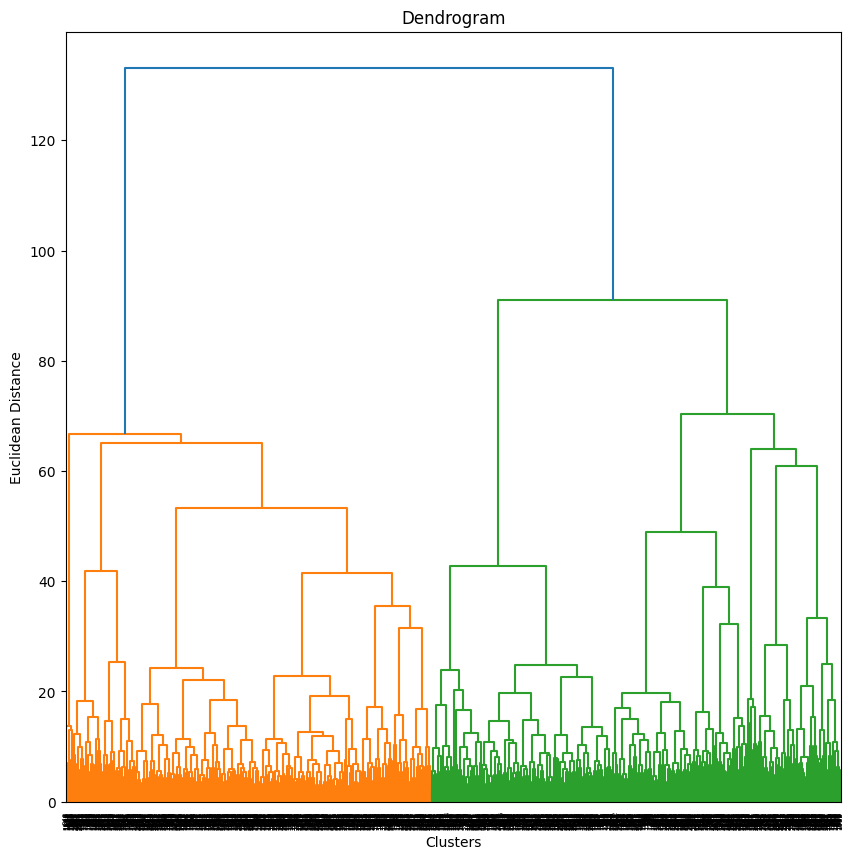

In [127]:
fig = plt.figure(figsize=(10,10))
dendrogram_plot = dendrogram(linkage(df_marketing_campaign_num_scaled, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Clusters')
plt.ylabel('Euclidean Distance')
plt.show()

In [128]:
agglomerative_model_c2 = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
agglomerative_model_c3 = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
agglomerative_model_c4 = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
agglomerative_model_c5 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='ward')
agglomerative_model_c6 = AgglomerativeClustering(n_clusters=6, metric='euclidean', linkage='ward')
agglomerative_model_c7 = AgglomerativeClustering(n_clusters=7, metric='euclidean', linkage='ward')
agglomerative_model_c8 = AgglomerativeClustering(n_clusters=8, metric='euclidean', linkage='ward')
agglomerative_model_c9 = AgglomerativeClustering(n_clusters=9, metric='euclidean', linkage='ward')

y_c2 = agglomerative_model_c2.fit_predict(df_marketing_campaign_num_scaled)
y_c3 = agglomerative_model_c3.fit_predict(df_marketing_campaign_num_scaled)
y_c4 = agglomerative_model_c4.fit_predict(df_marketing_campaign_num_scaled)
y_c5 = agglomerative_model_c5.fit_predict(df_marketing_campaign_num_scaled)
y_c6 = agglomerative_model_c6.fit_predict(df_marketing_campaign_num_scaled)
y_c7 = agglomerative_model_c7.fit_predict(df_marketing_campaign_num_scaled)
y_c8 = agglomerative_model_c8.fit_predict(df_marketing_campaign_num_scaled)
y_c9 = agglomerative_model_c9.fit_predict(df_marketing_campaign_num_scaled)

print(f'2 clusters: {silhouette_score(df_marketing_campaign_num_scaled,y_c2)}')
print(f'3 clusters: {silhouette_score(df_marketing_campaign_num_scaled,y_c3)}')
print(f'4 clusters: {silhouette_score(df_marketing_campaign_num_scaled,y_c4)}')
print(f'5 clusters: {silhouette_score(df_marketing_campaign_num_scaled,y_c5)}')
print(f'6 clusters: {silhouette_score(df_marketing_campaign_num_scaled,y_c6)}')
print(f'7 clusters: {silhouette_score(df_marketing_campaign_num_scaled,y_c7)}')
print(f'8 clusters: {silhouette_score(df_marketing_campaign_num_scaled,y_c8)}')
print(f'9 clusters: {silhouette_score(df_marketing_campaign_num_scaled,y_c9)}')

df_marketing_campaign['ac'] = y_c8

2 clusters: 0.15330017044382788
3 clusters: 0.09962914675403393
4 clusters: 0.10969784707726142
5 clusters: 0.12137774292538027
6 clusters: 0.1349836255610702
7 clusters: 0.14468739176937373
8 clusters: 0.15894568743687473
9 clusters: 0.11146151134495066


ac


0    839
2    510
1    385
5    177
3    128
7    106
6     30
4     20
Name: ac, dtype: int64


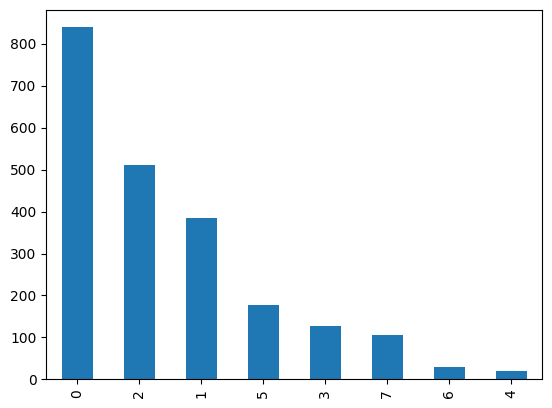

In [129]:
print('ac')
print('\n')
print(df_marketing_campaign['ac'].value_counts())
df_marketing_campaign['ac'].value_counts().plot(kind='bar')
plt.show()
print('\n')

## DBSCAN

### 2 PCA

In [130]:
nn_model = NearestNeighbors(n_neighbors=2)
nn_fit = nn_model.fit(df_marketing_campaign_num_scaled_pca2)
distances, indices = nn_fit.kneighbors(df_marketing_campaign_num_scaled_pca2)

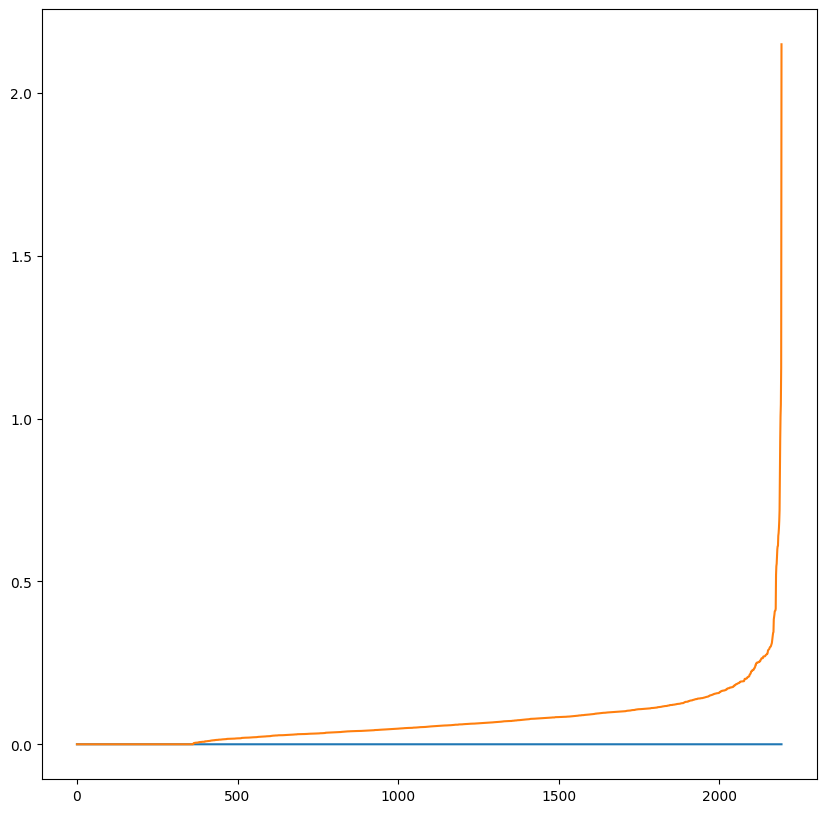

In [131]:
distances = np.sort(distances, axis=0)
distances[:,1]
plt.figure(figsize=(10,10))
plt.plot(distances)
plt.show()

In [132]:
eps_values = np.arange(0.1, 1, 0.1)
min_samples = np.arange(2,10)

In [133]:
dbscan_params = list(product(eps_values,min_samples))

sil_scores = []
n_clusters = []
for p in dbscan_params:
  y_pred = DBSCAN(eps=p[0], min_samples=p[1]).fit_predict(df_marketing_campaign_num_scaled_pca2)
  sil_scores.append(silhouette_score(df_marketing_campaign_num_scaled_pca2,y_pred))
  n_clusters.append(len(np.unique(y_pred)))

In [134]:
df_param_tunning = pd.DataFrame(dbscan_params, columns=['eps','min_samples'])
df_param_tunning['sil_scores'] = sil_scores
df_param_tunning['n_clusters'] = n_clusters

In [135]:
pivot_1 = pd.pivot_table(df_param_tunning, values='sil_scores', columns='eps', index='min_samples')
pivot_2 = pd.pivot_table(df_param_tunning, values='n_clusters', columns='eps', index='min_samples')

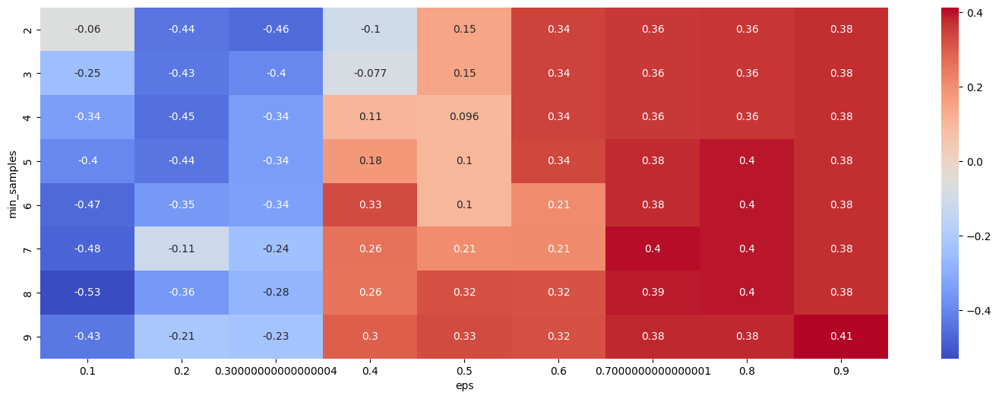

In [136]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

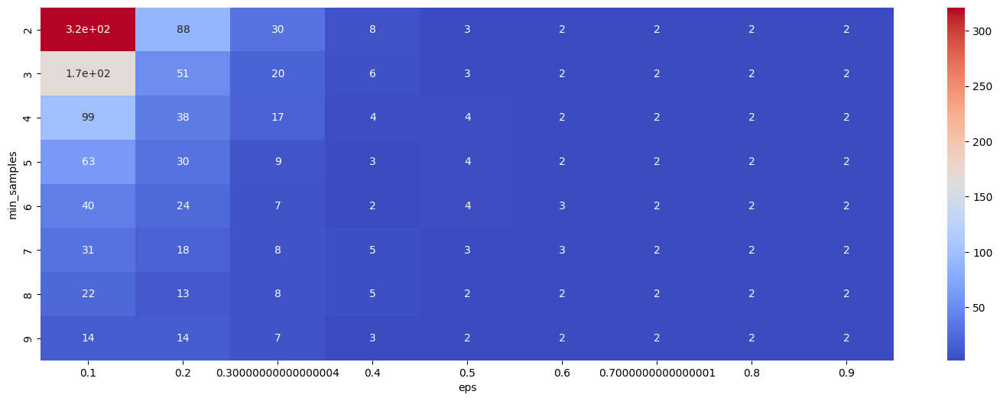

In [137]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_2, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

In [138]:
dbscan_model = DBSCAN(eps=0.4, min_samples=5)
y_dbscan_pca2 = dbscan_model.fit_predict(df_marketing_campaign_num_scaled_pca2)

print(silhouette_score(df_marketing_campaign_num_scaled_pca2, y_dbscan_pca2))
df_marketing_campaign['DBSCAN_pca2'] = y_dbscan_pca2

0.18086464387685808


DBSCAN_pca2


 0    2147
-1      43
 1       5
Name: DBSCAN_pca2, dtype: int64


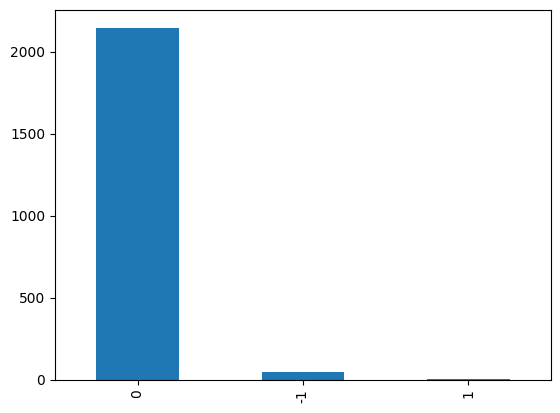

In [139]:
print('DBSCAN_pca2')
print('\n')
print(df_marketing_campaign['DBSCAN_pca2'].value_counts())
df_marketing_campaign['DBSCAN_pca2'].value_counts().plot(kind='bar')
plt.show()
print('\n')

### 3 PCA

In [140]:
nn_model = NearestNeighbors(n_neighbors=2)
nn_fit = nn_model.fit(df_marketing_campaign_num_scaled_pca3)
distances, indices = nn_fit.kneighbors(df_marketing_campaign_num_scaled_pca3)

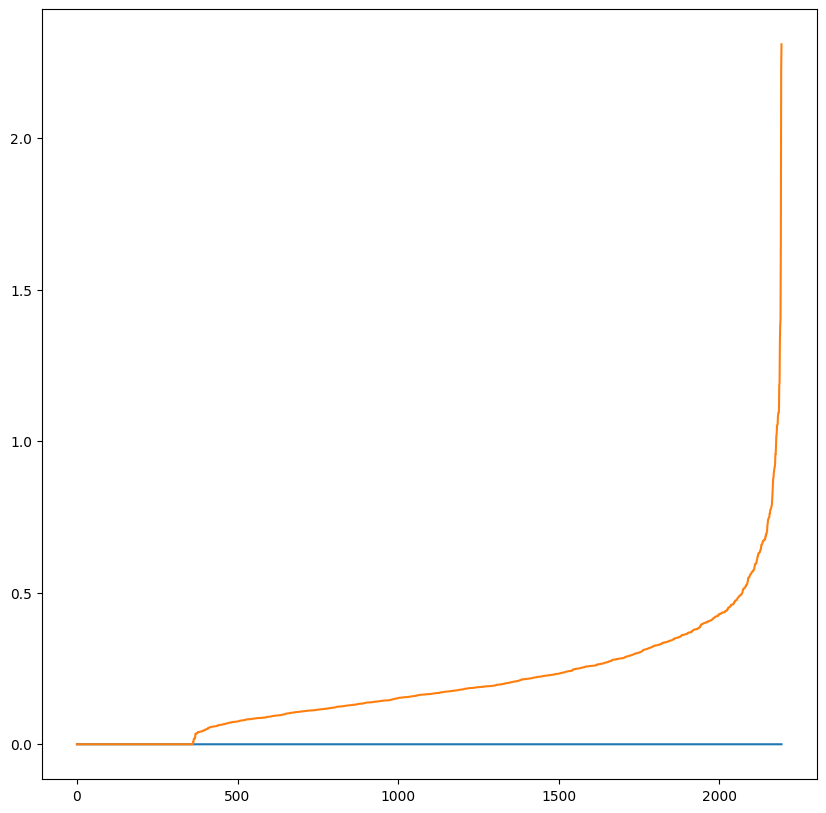

In [141]:
distances = np.sort(distances, axis=0)
distances[:,1]
plt.figure(figsize=(10,10))
plt.plot(distances)
plt.show()

In [142]:
eps_values = np.arange(0.3, 1.3, 0.1)
min_samples = np.arange(2,10)

In [143]:
dbscan_params = list(product(eps_values,min_samples))

sil_scores = []
n_clusters = []
for p in dbscan_params:
  y_pred = DBSCAN(eps=p[0], min_samples=p[1]).fit_predict(df_marketing_campaign_num_scaled_pca3)
  sil_scores.append(silhouette_score(df_marketing_campaign_num_scaled_pca3,y_pred))
  n_clusters.append(len(np.unique(y_pred)))

In [144]:
df_param_tunning = pd.DataFrame(dbscan_params, columns=['eps','min_samples'])
df_param_tunning['sil_scores'] = sil_scores
df_param_tunning['n_clusters'] = n_clusters

In [145]:
pivot_1 = pd.pivot_table(df_param_tunning, values='sil_scores', columns='eps', index='min_samples')
pivot_2 = pd.pivot_table(df_param_tunning, values='n_clusters', columns='eps', index='min_samples')

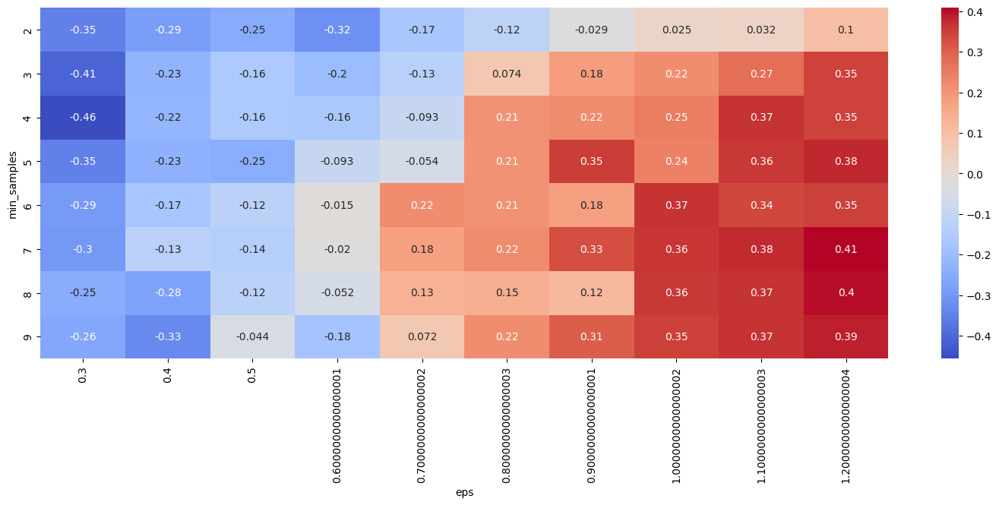

In [146]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

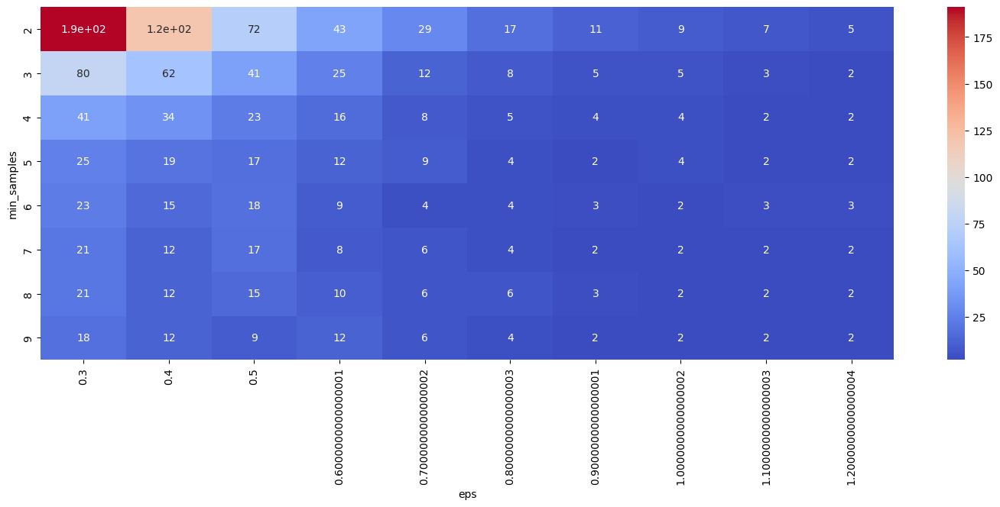

In [147]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_2, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

In [148]:
dbscan_model = DBSCAN(eps=1.2, min_samples=6)
y_dbscan_pca3 = dbscan_model.fit_predict(df_marketing_campaign_num_scaled_pca3)

print(silhouette_score(df_marketing_campaign_num_scaled_pca3, y_dbscan_pca3))
df_marketing_campaign['DBSCAN_pca3'] = y_dbscan_pca3

0.34804619831411865


DBSCAN_pca3


 0    2172
-1      17
 1       6
Name: DBSCAN_pca3, dtype: int64


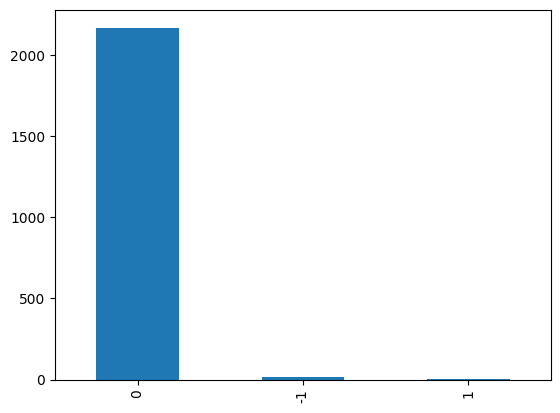

In [149]:
print('DBSCAN_pca3')
print('\n')
print(df_marketing_campaign['DBSCAN_pca3'].value_counts())
df_marketing_campaign['DBSCAN_pca3'].value_counts().plot(kind='bar')
plt.show()
print('\n')

### 4 PCA

In [150]:
nn_model = NearestNeighbors(n_neighbors=2)
nn_fit = nn_model.fit(df_marketing_campaign_num_scaled_pca4)
distances, indices = nn_fit.kneighbors(df_marketing_campaign_num_scaled_pca4)

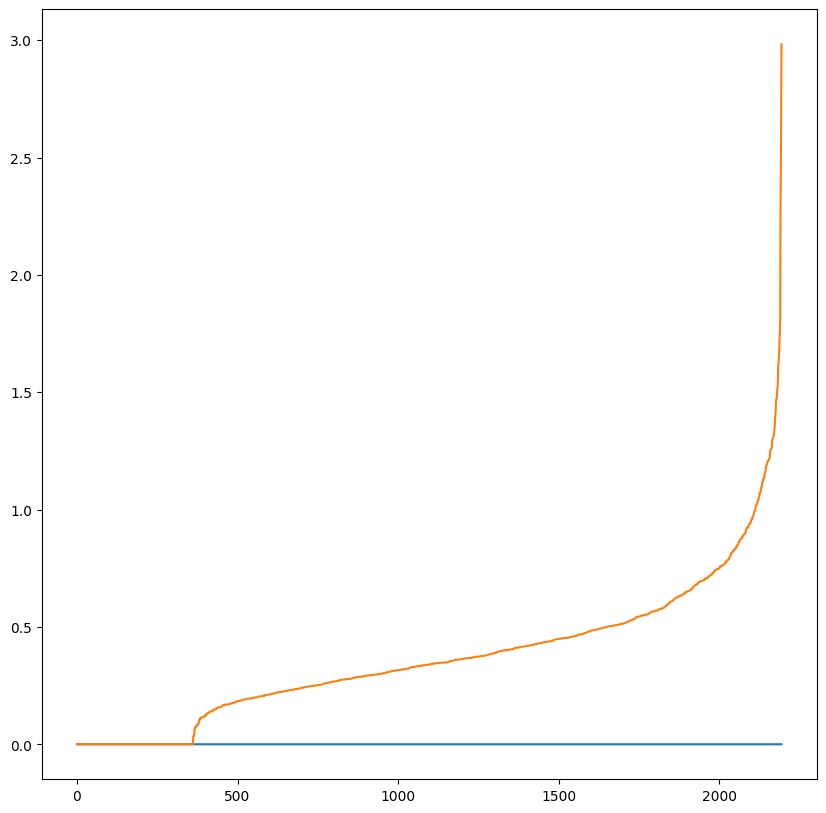

In [151]:
distances = np.sort(distances, axis=0)
distances[:,1]
plt.figure(figsize=(10,10))
plt.plot(distances)
plt.show()

In [152]:
eps_values = np.arange(0.5, 1.5, 0.1)
min_samples = np.arange(2,10)

In [153]:
dbscan_params = list(product(eps_values,min_samples))

sil_scores = []
n_clusters = []
for p in dbscan_params:
  y_pred = DBSCAN(eps=p[0], min_samples=p[1]).fit_predict(df_marketing_campaign_num_scaled_pca4)
  sil_scores.append(silhouette_score(df_marketing_campaign_num_scaled_pca4,y_pred))
  n_clusters.append(len(np.unique(y_pred)))

In [154]:
df_param_tunning = pd.DataFrame(dbscan_params, columns=['eps','min_samples'])
df_param_tunning['sil_scores'] = sil_scores
df_param_tunning['n_clusters'] = n_clusters

In [155]:
pivot_1 = pd.pivot_table(df_param_tunning, values='sil_scores', columns='eps', index='min_samples')
pivot_2 = pd.pivot_table(df_param_tunning, values='n_clusters', columns='eps', index='min_samples')

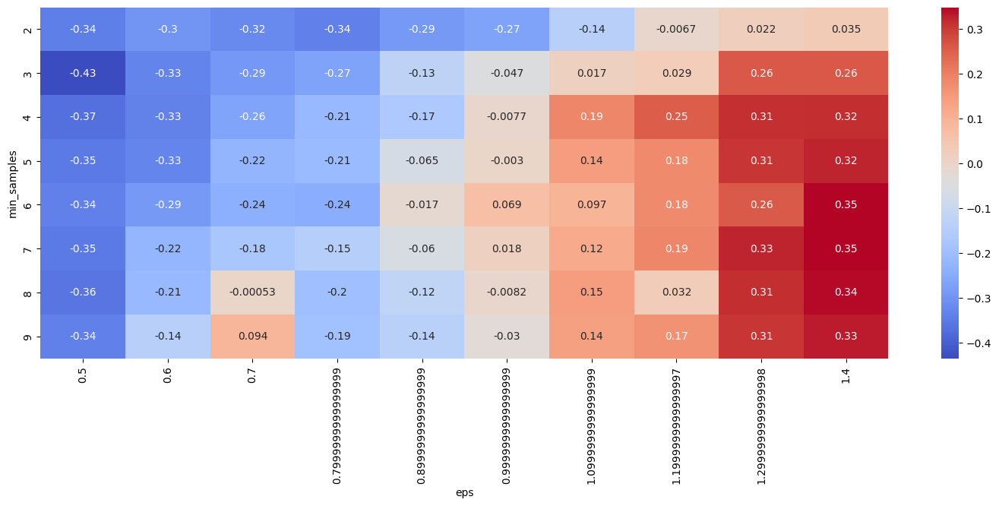

In [156]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

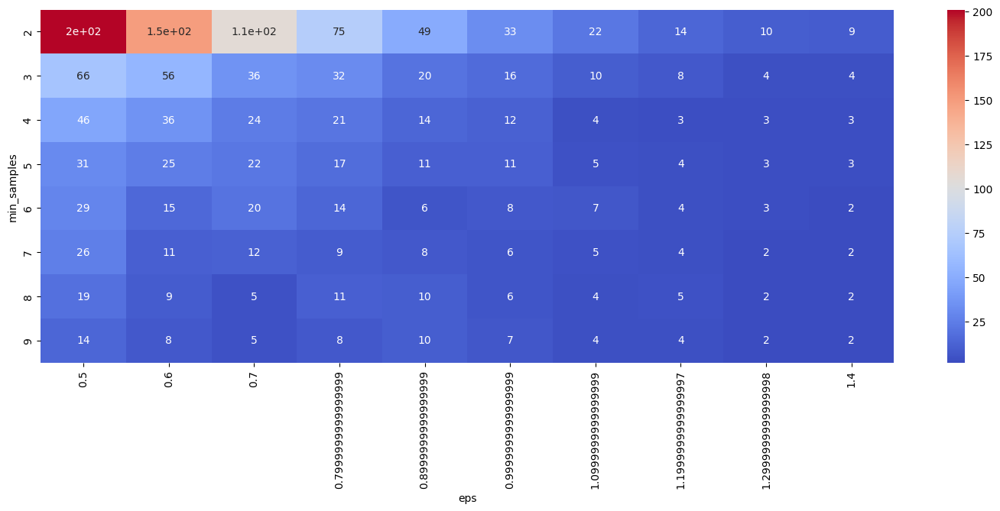

In [157]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_2, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

In [158]:
dbscan_model = DBSCAN(eps=1.4, min_samples=5)
y_dbscan_pca4 = dbscan_model.fit_predict(df_marketing_campaign_num_scaled_pca4)

print(silhouette_score(df_marketing_campaign_num_scaled_pca4, y_dbscan_pca4))
df_marketing_campaign['DBSCAN_pca4'] = y_dbscan_pca4

0.3236811866060917


DBSCAN_pca4


 0    2149
-1      41
 1       5
Name: DBSCAN_pca4, dtype: int64


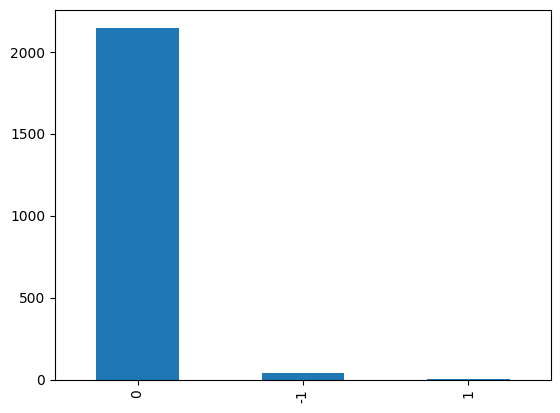

In [159]:
print('DBSCAN_pca4')
print('\n')
print(df_marketing_campaign['DBSCAN_pca4'].value_counts())
df_marketing_campaign['DBSCAN_pca4'].value_counts().plot(kind='bar')
plt.show()
print('\n')

### 5 PCA

In [160]:
nn_model = NearestNeighbors(n_neighbors=2)
nn_fit = nn_model.fit(df_marketing_campaign_num_scaled_pca5)
distances, indices = nn_fit.kneighbors(df_marketing_campaign_num_scaled_pca5)

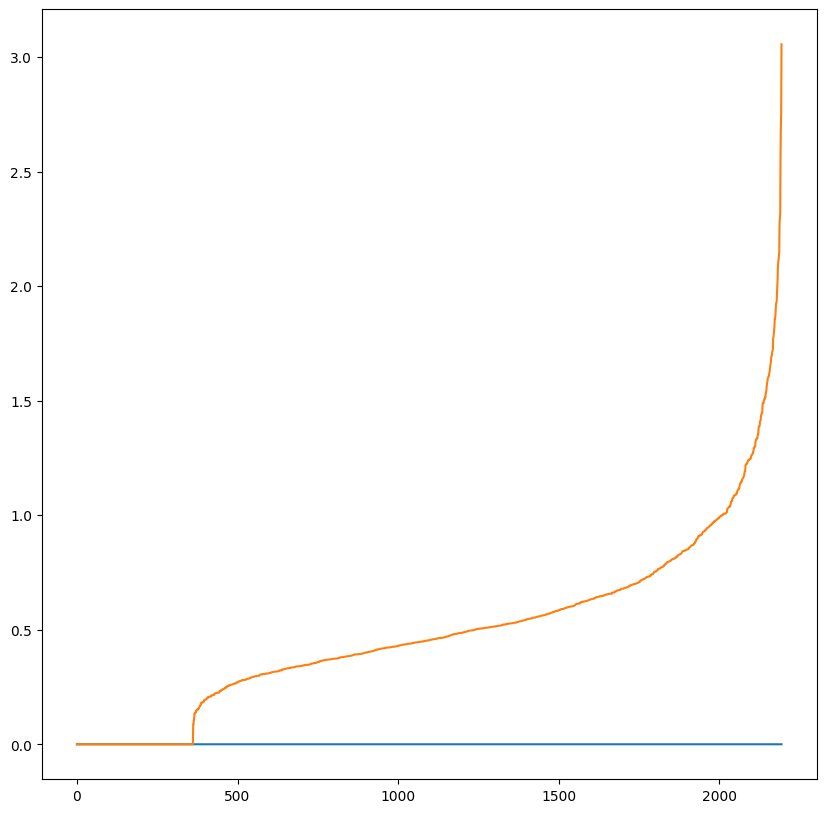

In [161]:
distances = np.sort(distances, axis=0)
distances[:,1]
plt.figure(figsize=(10,10))
plt.plot(distances)
plt.show()

In [162]:
eps_values = np.arange(1, 2, 0.1)
min_samples = np.arange(2,10)

In [163]:
dbscan_params = list(product(eps_values,min_samples))

sil_scores = []
n_clusters = []
for p in dbscan_params:
  y_pred = DBSCAN(eps=p[0], min_samples=p[1]).fit_predict(df_marketing_campaign_num_scaled_pca5)
  sil_scores.append(silhouette_score(df_marketing_campaign_num_scaled_pca5,y_pred))
  n_clusters.append(len(np.unique(y_pred)))

In [164]:
df_param_tunning = pd.DataFrame(dbscan_params, columns=['eps','min_samples'])
df_param_tunning['sil_scores'] = sil_scores
df_param_tunning['n_clusters'] = n_clusters

In [165]:
pivot_1 = pd.pivot_table(df_param_tunning, values='sil_scores', columns='eps', index='min_samples')
pivot_2 = pd.pivot_table(df_param_tunning, values='n_clusters', columns='eps', index='min_samples')

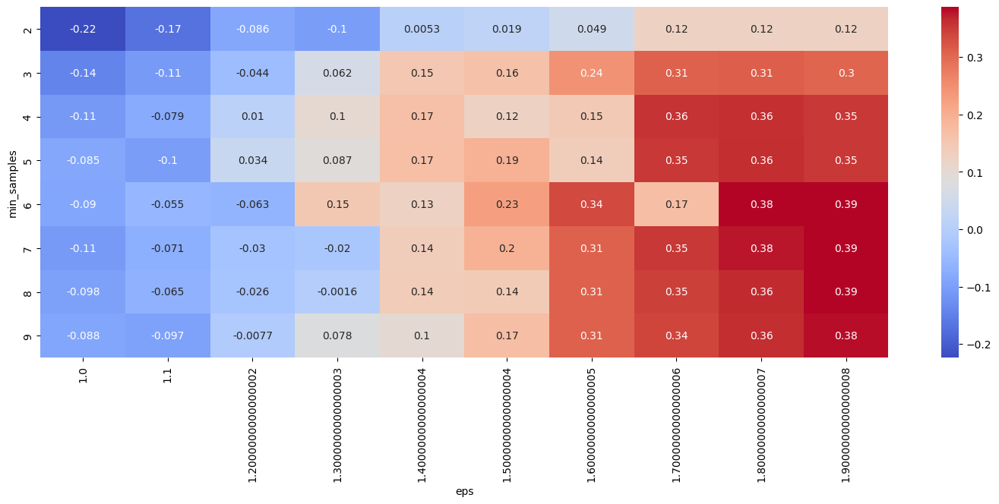

In [166]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

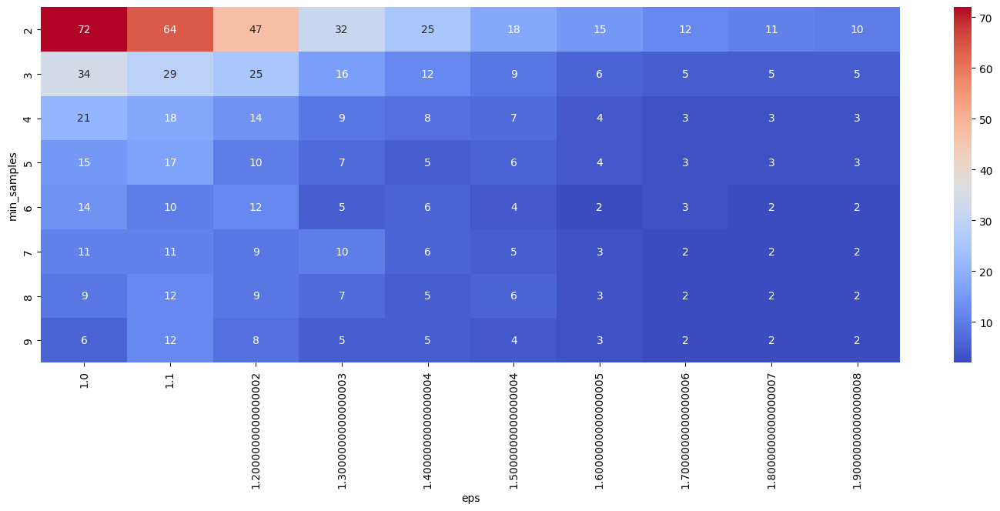

In [167]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_2, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

In [168]:
dbscan_model = DBSCAN(eps=1.9, min_samples=5)
y_dbscan_pca5 = dbscan_model.fit_predict(df_marketing_campaign_num_scaled_pca5)

print(silhouette_score(df_marketing_campaign_num_scaled_pca5, y_dbscan_pca5))
df_marketing_campaign['DBSCAN_pca5'] = y_dbscan_pca5

0.35361501291993314


DBSCAN_pca5


 0    2146
-1      40
 1       9
Name: DBSCAN_pca5, dtype: int64


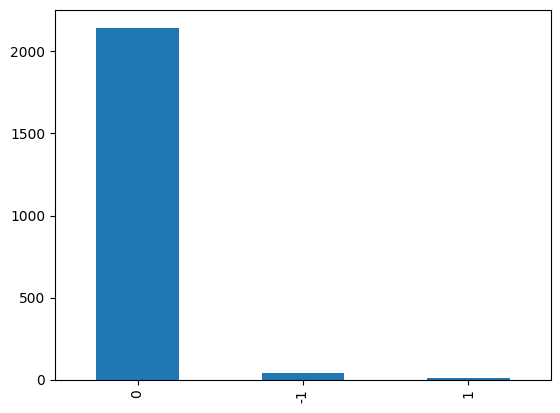

In [169]:
print('DBSCAN_pca5')
print('\n')
print(df_marketing_campaign['DBSCAN_pca5'].value_counts())
df_marketing_campaign['DBSCAN_pca5'].value_counts().plot(kind='bar')
plt.show()
print('\n')

### Without PCA

In [170]:
nn_model = NearestNeighbors(n_neighbors=2)
nn_fit = nn_model.fit(df_marketing_campaign_num_scaled)
distances, indices = nn_fit.kneighbors(df_marketing_campaign_num_scaled)

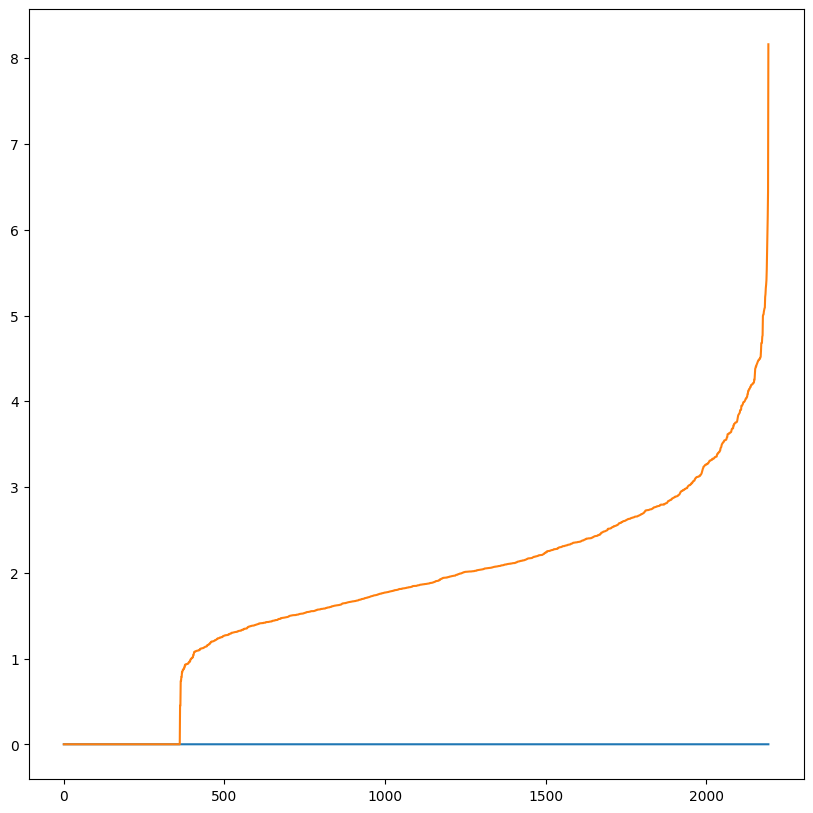

In [171]:
distances = np.sort(distances, axis=0)
distances[:,1]
plt.figure(figsize=(10,10))
plt.plot(distances)
plt.show()

In [172]:
eps_values = np.arange(4, 6, 0.1)
min_samples = np.arange(2,10)

In [173]:
dbscan_params = list(product(eps_values,min_samples))

sil_scores = []
n_clusters = []
for p in dbscan_params:
  y_pred = DBSCAN(eps=p[0], min_samples=p[1]).fit_predict(df_marketing_campaign_num_scaled)
  sil_scores.append(silhouette_score(df_marketing_campaign_num_scaled,y_pred))
  n_clusters.append(len(np.unique(y_pred)))

In [174]:
df_param_tunning = pd.DataFrame(dbscan_params, columns=['eps','min_samples'])
df_param_tunning['sil_scores'] = sil_scores
df_param_tunning['n_clusters'] = n_clusters

In [175]:
pivot_1 = pd.pivot_table(df_param_tunning, values='sil_scores', columns='eps', index='min_samples')
pivot_2 = pd.pivot_table(df_param_tunning, values='n_clusters', columns='eps', index='min_samples')

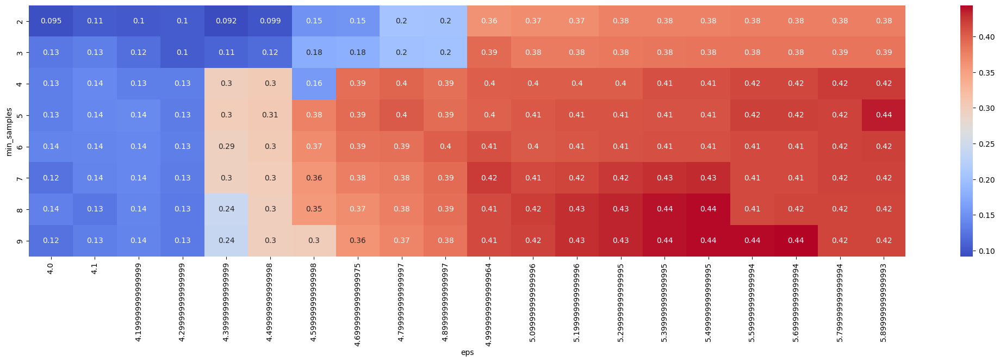

In [176]:
fig, ax = plt.subplots(figsize=(26,6))
sns.heatmap(pivot_1, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

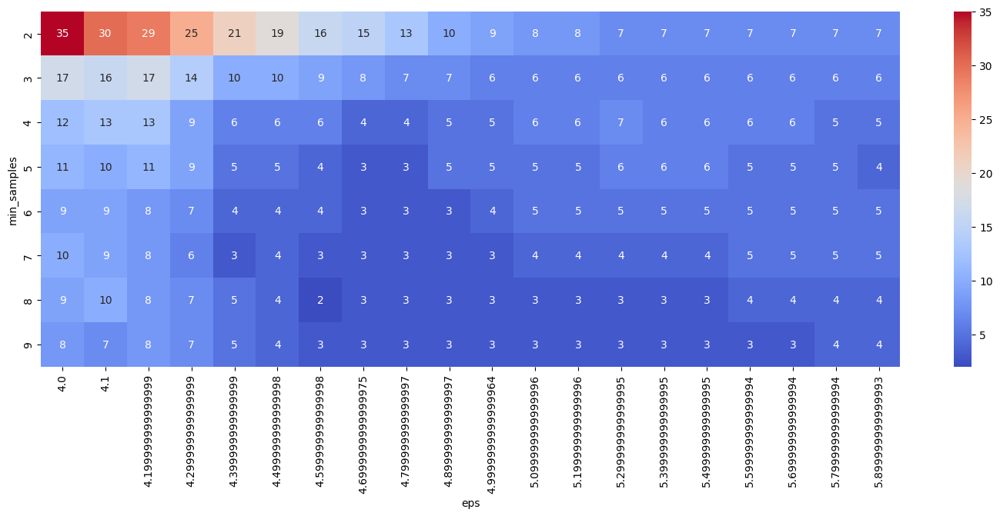

In [177]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_2, annot=True, annot_kws={'size':10}, cmap='coolwarm', ax=ax)
plt.show()

In [178]:
dbscan_model = DBSCAN(eps=5.4, min_samples=9)
y_dbscan = dbscan_model.fit_predict(df_marketing_campaign_num_scaled)

print(silhouette_score(df_marketing_campaign_num_scaled, y_dbscan))
df_marketing_campaign['DBSCAN'] = y_dbscan

0.43870469954075636


DBSCAN


 0    2140
-1      38
 1      17
Name: DBSCAN, dtype: int64


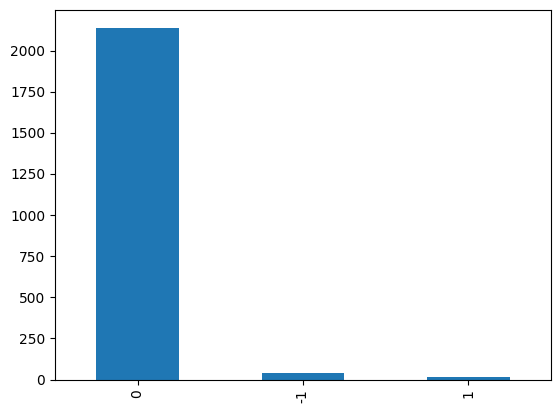

In [179]:
print('DBSCAN')
print('\n')
print(df_marketing_campaign['DBSCAN'].value_counts())
df_marketing_campaign['DBSCAN'].value_counts().plot(kind='bar')
plt.show()
print('\n')

# Evaluation and profiling

The best silhouette scores were done by K-Means with 2 PCA (50%) and Agglomerative Clustering with 2 PCA (49%). When we plot the graphs, we see that there is no major difference between the results, so we keep the clusters made by K-means.

In [180]:
df_marketing_campaign.columns

Index(['ID', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Recency', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Education_int', 'WithPartner',
       'Dt_Customer_diff_days', 'MntTotalSpent', 'NumTotalPurchases',
       'AcceptedOfferAnyCmp', 'IsParent', 'ProductMostSpent',
       'ProductLeastSpent', 'ProductMostSpent_int', 'ProductLeastSpent_int',
       'Decade_Born', 'kmeans_pca2', 'kmeans', 'ac_pca2', 'ac_pca3', 'ac_pca4',
       'ac_pca5', 'ac', 'DBSCAN_pca2', 'DBSCAN_pca3', 'DBSCAN_pca4',
       'DBSCAN_pca5', 'DBSCAN'],
      dtype='object')

In [181]:
df_marketing_campaign_num.columns

Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Education_int',
       'WithPartner', 'Dt_Customer_diff_days', 'MntTotalSpent',
       'NumTotalPurchases', 'AcceptedOfferAnyCmp', 'IsParent',
       'ProductMostSpent_int', 'ProductLeastSpent_int', 'Decade_Born'],
      dtype='object')

In [182]:
df_marketing_campaign['kmeans_pca2'].value_counts()

0    986
2    696
1    513
Name: kmeans_pca2, dtype: int64

In [183]:
df_aux_displot = df_marketing_campaign[['Income', 'Kidhome', 'Teenhome', 'Recency', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Decade_Born',
       'Education_int', 'WithPartner', 'Dt_Customer_diff_days',
       'MntTotalSpent', 'NumTotalPurchases', 'AcceptedOfferAnyCmp', 'IsParent',
       'ProductMostSpent_int', 'ProductLeastSpent_int', 'kmeans_pca2']].copy()

In [184]:
df_aux_displot = pd.concat([df_aux_displot, df_saved_columns], axis=1)
df_marketing_campaign = pd.concat([df_marketing_campaign, df_saved_columns], axis=1)
column_to_move = df_aux_displot.pop("kmeans_pca2")
df_aux_displot.insert(len(df_aux_displot.columns), "kmeans_pca2", column_to_move)

In [185]:
df_aux_displot.columns

Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Decade_Born',
       'Education_int', 'WithPartner', 'Dt_Customer_diff_days',
       'MntTotalSpent', 'NumTotalPurchases', 'AcceptedOfferAnyCmp', 'IsParent',
       'ProductMostSpent_int', 'ProductLeastSpent_int', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'Year_Birth', 'age_customer_enrollment', 'kmeans_pca2'],
      dtype='object')

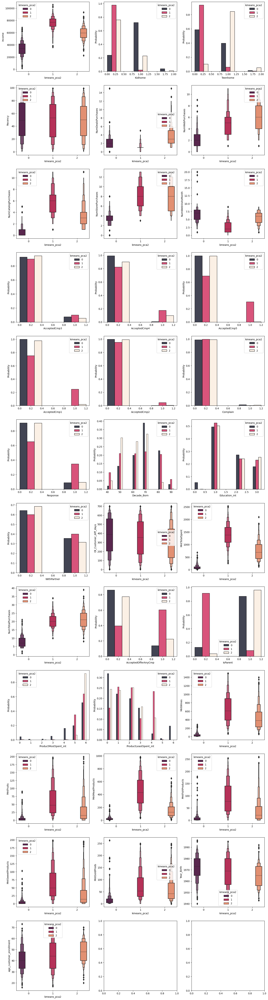

In [186]:
df_averages = pd.DataFrame({'Clusters': [0,1,2]})

n_cols =  3
n_rows = int(np.ceil(((df_aux_displot.shape[1]-1) / n_cols)))

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(18, (n_rows*6)))
for i, column in enumerate(df_aux_displot.columns):
       if column == 'kmeans_pca2':
              continue
       if(len(df_marketing_campaign[column].unique()) <= 10):
              var_binwidth=0.4
              if column == 'Decade_Born':
                     var_binwidth=4
              sns.histplot(
                     df_marketing_campaign[[column,'kmeans_pca2']], 
                     x = column,
                     hue="kmeans_pca2", 
                     multiple="dodge",
                     stat = 'probability',
                     common_norm=False,
                     binwidth=var_binwidth,
                     palette='rocket',
                     ax=axes[i//n_cols,i%n_cols],
              )
       else:
              sns.boxenplot(
                     df_marketing_campaign[[column,'kmeans_pca2']], 
                     x = "kmeans_pca2",
                     y = column,
                     hue="kmeans_pca2", 
                     palette='rocket',
                     ax=axes[i//n_cols,i%n_cols],
              )
              df_averages_aux = df_marketing_campaign[[column, 'kmeans_pca2']].groupby(['kmeans_pca2']).mean().sort_values(by='kmeans_pca2').reset_index().drop(columns=['kmeans_pca2'])
              df_averages = pd.concat([df_averages, df_averages_aux], axis=1)

In [187]:
df_averages.pivot_table(columns=['Clusters'])

Clusters,0,1,2
Dt_Customer_diff_days,375.228195,349.746589,299.449713
Income,33765.561866,76089.654971,59083.579023
MntFishProducts,8.151116,92.157895,39.525862
MntFruits,5.206897,62.311891,30.073276
MntGoldProds,16.572008,73.846004,60.076149
MntMeatProducts,23.076065,456.329435,151.096264
MntSweetProducts,5.425963,63.643275,30.866379
MntTotalSpent,95.002028,1394.095517,751.685345
MntWines,36.569980,645.807018,440.047414
NumCatalogPurchases,0.520284,5.861598,3.257184


In [188]:
fig_2d = px.scatter(
    df_marketing_campaign_num_scaled_pca2, x=0, y=1,
    color=kmeans_model_pca2.labels_, labels={'color': 'class'}
)

fig_2d.show()

#### Correlations more than 0.5

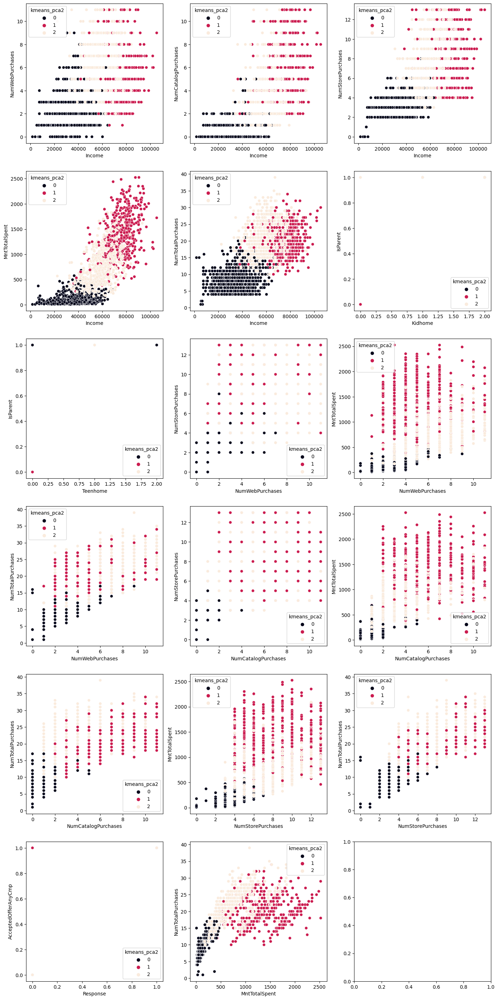

In [189]:

matrix = df_marketing_campaign_num.corr()
_ = np.round(matrix[(matrix > 0.5)].values, 2)
_[np.tril_indices(_.shape[0], 0)] = np.nan
matrix[:] = _
dict_corr_greater_05 = dict(matrix.stack().items())

n_cols =  3
n_rows = int(np.ceil((len(dict_corr_greater_05) / n_cols)))
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(17, (n_rows*6)))

for i, ((x, y), value) in enumerate(dict_corr_greater_05.items()):
       sns.scatterplot(
              data=df_marketing_campaign[[x, y, 'kmeans_pca2']], 
              x=x, 
              y=y,
              hue='kmeans_pca2',
              palette='rocket',
              ax=axes[i//n_cols,i%n_cols]
       )

#### Correlations less than - 0.5

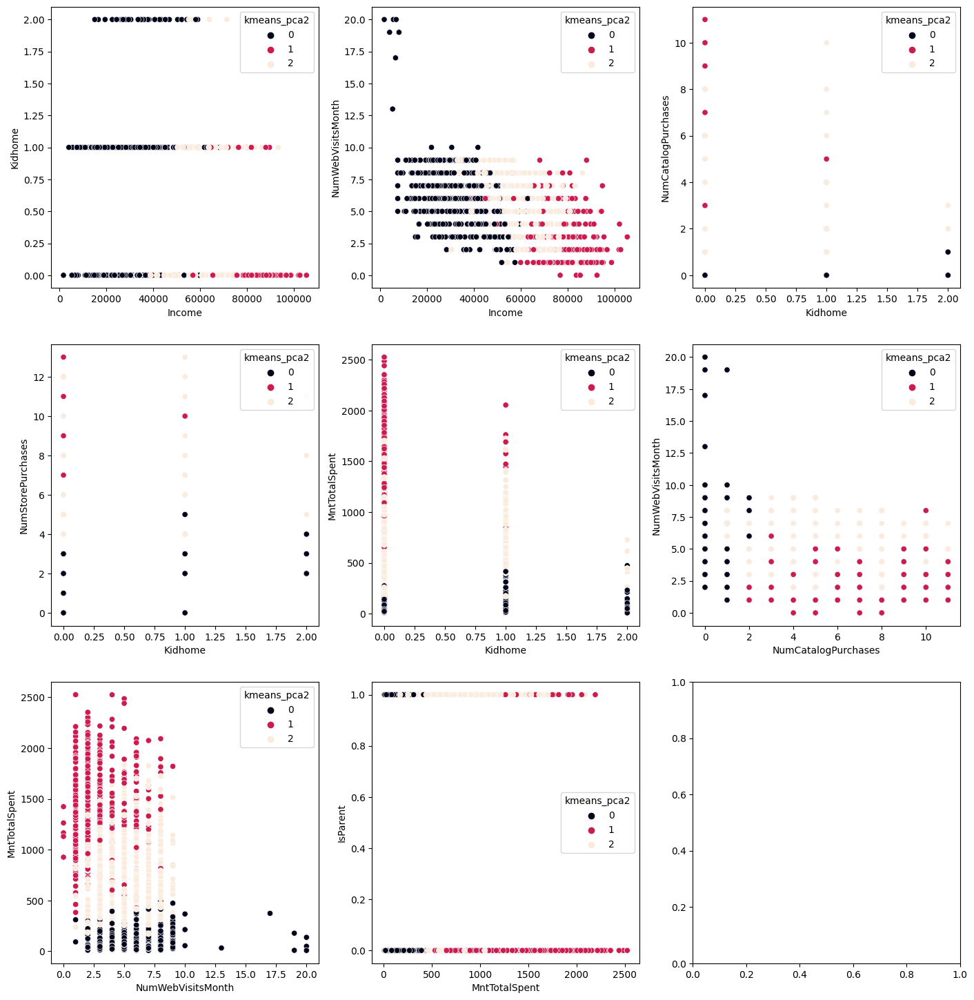

In [190]:

matrix = df_marketing_campaign_num.corr()
_ = np.round(matrix[(matrix < -0.5)].values, 2)
_[np.tril_indices(_.shape[0], 0)] = np.nan
matrix[:] = _
dict_corr_less_minus05 = dict(matrix.stack().items())

n_cols =  3
n_rows = int(np.ceil((len(dict_corr_less_minus05) / n_cols)))
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(17, (n_rows*6)))

for i, ((x, y), value) in enumerate(dict_corr_less_minus05.items()):
       sns.scatterplot(
              data=df_marketing_campaign[[x, y, 'kmeans_pca2']], 
              x=x, 
              y=y,
              hue='kmeans_pca2',
              palette='rocket',
              ax=axes[i//n_cols,i%n_cols]
       )

Insights among all clusters:
-	Similar distributions on number of days since last purchase.
-	Almost nobody complained in the last 2 years.
-	Similar proportion between having a partner (≈65%) and not having.

Cluster 0:

-	On average, this is the group with least Income.
-	≈70% have a kid at home, ≈25% don’t.
-	Could have a teenager at home (≈59%) or not (≈40%)
-	Most of them are parents (≈90% are, ≈10% are not)
-	On average, least purchases made from every origin between all groups.
-	On average, this is the group with more website visits in “the last month” (only a few more).
-	Least group to accept in Campaign 4
-	Most of them were born between the 60’s and 80’s (≈80%)
-	They are the group that least spent.
-	They are the group that least accepted an offer in any campaign. Only ≈15%.
-	≈65% of them are with a partner, ≈35% are not.  
-	Among all products categories, most customers in this group individually choose wine to spend the most (≈55% of them). Also, they are the only group which its customers could spend the most on fruits, sweet, fish and gold products compared to the other groups.
-	Among all products categories, this is the only group that has customers who could choose wine to spent the least.
-	On average, they as a group spend the least on every product category compared to the other groups.

Cluster 1:

-	On average, this is the group with most Income.
-	Most of them are not parents (≈97%).
-	On average, this group is the least which made purchases with a discount.
-	On average, this group tops on purchases made using a catalog.
-	On average, is the group with least website visits in “the last month”.
-	This group is the only one which has more customers who are prone to accept an offer of any campaign (≈60%). Also, this group leads on accepted offers on all the campaigns.
-	On average, this group is the one which spent the most in every category of products and in total.
-	≈60% of them are with a partner.  
-	Among all products categories, most customers in this group individually choose wine to spend the most (≈ 65%) and meat in second place (≈ 34%).
-	Among all products categories, most customers in this group individually could choose every category of product to spend the least, except for meat and wine.
-	On average, they as a group are in 2nd place in terms of amount spent on every product category compared to the other groups.


Cluster 2:

-	On average, this groups falls between the group that has more Income and the group that has less.
-	Only ≈20% have a kid at home, while ≈79% don’t.
-	Most of them have a teenager at home (≈85%), some don’t (≈10%)
-	Most of them are parents (≈95% are, ≈5% are not).
-	On average, this group tops on purchases with a discount.
-	On average, this group tops on purchases made through the website.
-	Most of them were born between the 50’s and 70’s (≈90%)
-	On average, this group is in 2nd place in terms of total amount spent.
-	Most of them haven’t accepted an offer from any campaign (≈79%).
-	≈69% of them are with a partner.  
-	On average, most people on this group enrolled slightly earlier in time than people from the other groups.
-	On average, this group leads in total number of purchases made from every origin, but it’s near to the Group 2.
-	Among all products categories, most customers in this group individually choose wine to spend the most (≈ 90%) and meat in second place (≈ 7%). Also, they lead between all groups to choose wine to spend the most compared to all product categories.
-	Among all products categories, most customers in this group individually could choose every category of product to spend the least, except for meat and wine.
-	On average, they as a group are in 2nd place in terms of spending on every product category compared to the other groups.


